# Telecom Churn Prediction Case Study

In [0]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score

import warnings
warnings.filterwarnings('ignore')

## Loading Data

In [0]:
#Displaying all the rows and columns
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

#Loading data from csv file
data = pd.read_csv("./Data/telecom_churn_data.csv")
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [0]:
#Shape of data
data.shape

(99999, 226)

## Segregating data based on datatype

In [0]:
#Printing the column names and their corresponding datatype
data.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Dtype  
---  ------                    -----  
 0   mobile_number             int64  
 1   circle_id                 int64  
 2   loc_og_t2o_mou            float64
 3   std_og_t2o_mou            float64
 4   loc_ic_t2o_mou            float64
 5   last_date_of_month_6      object 
 6   last_date_of_month_7      object 
 7   last_date_of_month_8      object 
 8   last_date_of_month_9      object 
 9   arpu_6                    float64
 10  arpu_7                    float64
 11  arpu_8                    float64
 12  arpu_9                    float64
 13  onnet_mou_6               float64
 14  onnet_mou_7               float64
 15  onnet_mou_8               float64
 16  onnet_mou_9               float64
 17  offnet_mou_6              float64
 18  offnet_mou_7              float64
 19  offnet_mou_8              float64
 20  offnet_mou_9              f

In [0]:
#Segregating data columns from numerical columns
date_cols = ['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','last_date_of_month_9',
             'date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9',
             'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']

num_cols = [col for col in data.columns if col not in date_cols]

print(len(date_cols))
print(len(num_cols))

12
214


## Check for missing data

In [0]:
#checking for missing data
missing_data = data.isna()
missing_data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,False,False,False,False,False,False,False,False,False,False,False,False,False,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,False,False,False,False,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,T

In [0]:
#Count of missing data for each column in the dataset
missing_data_count = missing_data.sum()
missing_data_count

mobile_number                   0
circle_id                       0
loc_og_t2o_mou               1018
std_og_t2o_mou               1018
loc_ic_t2o_mou               1018
last_date_of_month_6            0
last_date_of_month_7          601
last_date_of_month_8         1100
last_date_of_month_9         1659
arpu_6                          0
arpu_7                          0
arpu_8                          0
arpu_9                          0
onnet_mou_6                  3937
onnet_mou_7                  3859
onnet_mou_8                  5378
onnet_mou_9                  7745
offnet_mou_6                 3937
offnet_mou_7                 3859
offnet_mou_8                 5378
offnet_mou_9                 7745
roam_ic_mou_6                3937
roam_ic_mou_7                3859
roam_ic_mou_8                5378
roam_ic_mou_9                7745
roam_og_mou_6                3937
roam_og_mou_7                3859
roam_og_mou_8                5378
roam_og_mou_9                7745
loc_og_t2t_mou

In [0]:
#Percentage of missing data in each column
missing_data_percent = missing_data_count/len(data)
missing_data_percent.sort_values(ascending = False)

count_rech_2g_6             0.748467
date_of_last_rech_data_6    0.748467
count_rech_3g_6             0.748467
av_rech_amt_data_6          0.748467
max_rech_data_6             0.748467
total_rech_data_6           0.748467
arpu_3g_6                   0.748467
arpu_2g_6                   0.748467
night_pck_user_6            0.748467
fb_user_6                   0.748467
arpu_3g_7                   0.744287
count_rech_2g_7             0.744287
fb_user_7                   0.744287
count_rech_3g_7             0.744287
arpu_2g_7                   0.744287
av_rech_amt_data_7          0.744287
max_rech_data_7             0.744287
night_pck_user_7            0.744287
total_rech_data_7           0.744287
date_of_last_rech_data_7    0.744287
night_pck_user_9            0.740777
date_of_last_rech_data_9    0.740777
fb_user_9                   0.740777
arpu_2g_9                   0.740777
max_rech_data_9             0.740777
arpu_3g_9                   0.740777
total_rech_data_9           0.740777
a

## Checking for columns with unique values

The columns having 1 unique value throughout the dataset don't help us much in predicting the churn. So we are finding such columns and dropping them.

In [0]:
#Printing the column names which have only 1 unique value
uniq_cols = [col for col in data.columns if data[col].nunique() == 1]
uniq_cols

['circle_id',
 'loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_t2c_mou_9',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8',
 'std_ic_t2o_mou_9']

In [0]:
#Dropping columns with 1 unique values
data = data.drop(columns = uniq_cols)

## Imputing missing values

From the above analysis of missing data, we could see there is a good percentage of NAN or null values. Those values occur when customers don't make any calls or receive any calls or recharge their numbers. In other words, these values occur when customers don't use their sim at all. So we will impute the NAN values with 0.

In [0]:
#Imputing missing values with zero
num_cols = [col for col in data.columns if col not in date_cols]
data[num_cols] = data[num_cols].apply(lambda x: x.fillna(0))

In [0]:
#Confirming that all the missing values are imputed
data[num_cols].isna().sum()

mobile_number         0
arpu_6                0
arpu_7                0
arpu_8                0
arpu_9                0
onnet_mou_6           0
onnet_mou_7           0
onnet_mou_8           0
onnet_mou_9           0
offnet_mou_6          0
offnet_mou_7          0
offnet_mou_8          0
offnet_mou_9          0
roam_ic_mou_6         0
roam_ic_mou_7         0
roam_ic_mou_8         0
roam_ic_mou_9         0
roam_og_mou_6         0
roam_og_mou_7         0
roam_og_mou_8         0
roam_og_mou_9         0
loc_og_t2t_mou_6      0
loc_og_t2t_mou_7      0
loc_og_t2t_mou_8      0
loc_og_t2t_mou_9      0
loc_og_t2m_mou_6      0
loc_og_t2m_mou_7      0
loc_og_t2m_mou_8      0
loc_og_t2m_mou_9      0
loc_og_t2f_mou_6      0
loc_og_t2f_mou_7      0
loc_og_t2f_mou_8      0
loc_og_t2f_mou_9      0
loc_og_t2c_mou_6      0
loc_og_t2c_mou_7      0
loc_og_t2c_mou_8      0
loc_og_t2c_mou_9      0
loc_og_mou_6          0
loc_og_mou_7          0
loc_og_mou_8          0
loc_og_mou_9          0
std_og_t2t_mou_6

After the analysis, we could see there are no null or NAN values in the dataset.

In [0]:
#Shape of Data after dropping columns with 1 unique value
data.shape

(99999, 210)

## Calculating Churn 

For telecom companies, majority of revenue comes from highly valued or top customers. So we will focus on highly values customers. If we reduce the churn of highly valued customers, the company's revenue loss ould be significantly reduced. So we are identifying the highly valued customers based on the recharge amount by having the 70th percentile as the cutoff limit.

In [0]:
#Calculating the total data recharge amount for each month
data['total_data_rech_amt_6'] = data['total_rech_data_6'] * data['av_rech_amt_data_6']
data['total_data_rech_amt_7'] = data['total_rech_data_7'] * data['av_rech_amt_data_7']

In [0]:
#Calculating the total amount for each month by adding the data recharge amount and the voice recharge amount
data['total_amt_6'] = data[['total_rech_amt_6','total_data_rech_amt_6']].sum(axis=1)
data['total_amt_7'] = data[['total_rech_amt_7','total_data_rech_amt_7']].sum(axis=1)

In [0]:
#Calculating the average amount for months 6 and 7
data['avg_amt_6_7'] = (data['total_amt_6'] + data['total_amt_7'])/2

In [0]:
#Calculating the 70th Percentile of the Average amount
print("The value of 70th Percentile :", data['avg_amt_6_7'].quantile(0.7))

The value of 70th Percentile : 478.0


The 70th Percentile is 478 and so we would consider the customers who have done a avarage recharge of more than or equal to 478 in the months of June and July as 'Highly Valued Customers'.

In [0]:
#Filtering highly valued customers with recharge amount greater than 70th Percentile amount
top_customers_data = data.loc[data['avg_amt_6_7'] >= 478, :]
top_customers_data.reset_index(drop = True, inplace = True)

In [0]:
#Shape of data after filtering top customers
top_customers_data.shape

(30001, 215)

In [0]:
#Dropping the columns created for the calculation of 70th Percentile
temp_columns = ['total_data_rech_amt_6','total_data_rech_amt_7','total_amt_6','total_amt_7','avg_amt_6_7']
top_customers_data = top_customers_data.drop(temp_columns , axis = 1)

In [0]:
#Shape of data after dropping derived columns
top_customers_data.shape

(30001, 210)

The customers who are highly likely to churn are the ones whose usage is drastically reduced or no usage at all. So we are marking the churn flag for customers who haven't used the services in the last month. September.

In [0]:
#Differentiating the churn and Non churn customers by marking the churn flag
top_customers_data['churn'] = np.where(((top_customers_data['total_ic_mou_9'] == 0.00) & 
                                        (top_customers_data['total_og_mou_9'] == 0.00) & 
                                        (top_customers_data['vol_2g_mb_9'] == 0.00) & 
                                        (top_customers_data['vol_3g_mb_9'] == 0.00)) , 1, 0)

## Checking for data imbalance 

After calculating the churn column, here we will look at how the data is balanced between churn and Non-churn.

In [0]:
#Calculating the percentage of churn and Non churn customers
top_customers_data['churn'].value_counts()/top_customers_data['churn'].shape[0]

0    0.918636
1    0.081364
Name: churn, dtype: float64

## Exploratory Data Analysis

### Mobile Number Distribution 

Mobile number is unique for every subscriber. As it is unique, it doesn't add much value to our analysis. So we can get rid of Mobile number column before we get into our actual analysis. Before getting rid of the column, here we confirm that the mobile number is a unique one across customers.

In [0]:
#Checking the uniqueness of Mobile number column
top_customers_data['mobile_number'].value_counts().sort_values(ascending = False)


7000883200    1
7001560797    1
7002001474    1
7000688705    1
7001669696    1
7001405503    1
7001344001    1
7000891396    1
7000963079    1
7001292808    1
7001557001    1
7000628092    1
7001366540    1
7000455183    1
7000066065    1
7002376249    1
7001911318    1
7001260056    1
7000807451    1
7000154140    1
7001926821    1
7001344033    1
7000552550    1
7000705065    1
7002279978    1
7000385581    1
7000453166    1
7001843765    1
7001344129    1
7000209527    1
7000932511    1
7002366068    1
7001000185    1
7000137972    1
7000090717    1
7000698950    1
7000639561    1
7000903754    1
7002157134    1
7001575506    1
7000201299    1
7000224181    1
7001778261    1
7000471639    1
7001718872    1
7001786457    1
7000219740    1
7001665630    1
7002102003    1
7002130529    1
7002351861    1
7000373351    1
7000965224    1
7002280042    1
7000907884    1
7000975469    1
7000649838    1
7001583670    1
7000346682    1
7001009181    1
7000348827    1
7001581386    1
70000477

### Conclusion

The Mobile number is unique across subscribers. So the column can be dropped as it is not much of use in prediction.

### Churn Distribution

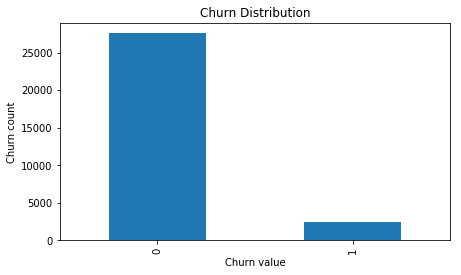

In [0]:
#Plotting the count of Churn and Non churn Customers
plt.figure(figsize=(7,4))
top_customers_data['churn'].value_counts().plot(x ='Churn value', y='Churn count', kind = 'bar')
plt.ylabel('Churn count')
plt.xlabel('Churn value')
plt.title('Churn Distribution')
plt.show()

### Conclusion

From the above plot, we can see the data is imbalanced. Out of the total data, around 90% are satisfied or Non churn customers whereas only 10% are unhappy customers.

### All Outgoing Calls

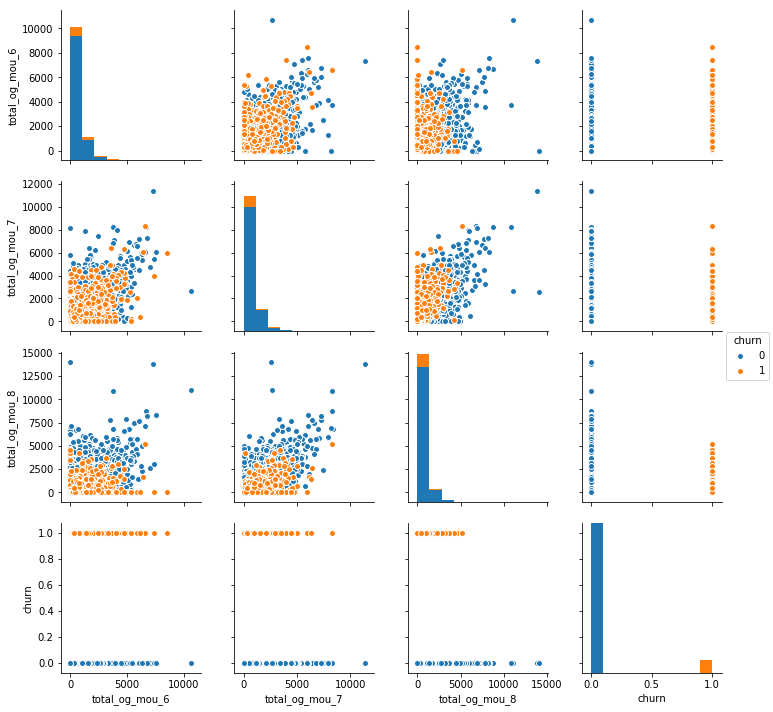

In [0]:
#Plotting Pair-Plot between Outgoing calls data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['total_og_mou_6','total_og_mou_7','total_og_mou_8','churn']],hue='churn')

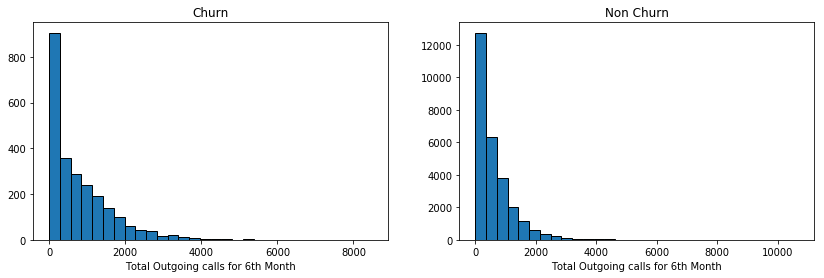

In [0]:
#Plotting histogram of Outgoing calls data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['total_og_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Total Outgoing calls for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['total_og_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Total Outgoing calls for 6th Month')

plt.show()

### Conclusion

1) If we compare the data of 6th month and 8th month in the pair plots, we could see the orange points are clustered towards 0 in the axis of 8th month whereas the blue points are distributed uniformly across months. This clearly shows the number of outgoing calls made by the churn customers have been significantly reduced between 6th and 8th months.

2)The histogram shows even the churn customers were making a good number of outgoing calls during the 6th month. This shows they were satisfied with the services during the initial days and their usage has been reduced during the subsequent months only.

### All Incoming Calls

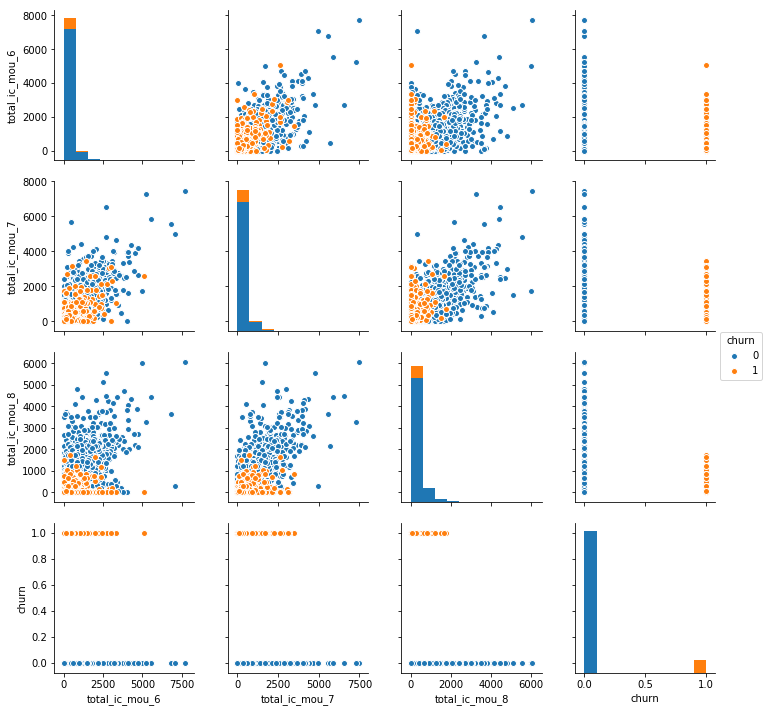

In [0]:
#Plotting Pair-Plot between Incoming calls data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','churn']],hue='churn')

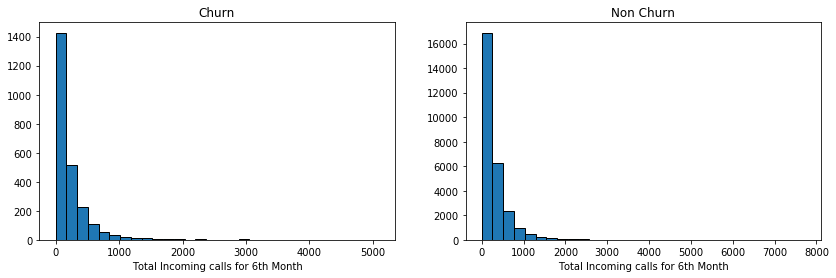

In [0]:
#Plotting histogram of Incoming calls data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['total_ic_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Total Incoming calls for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['total_ic_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Total Incoming calls for 6th Month')

plt.show()

### Conclusion

1) In contrast to outgoing calls, we could see the orange points are clustered towards 0 from 7th month itself whereas the blue points are distributed uniformly across months. This clearly shows the number of incoming calls started to drop from the 7th month itself for the churn customers.

2)The histogram shows even the churn customers were receiving a good number of incoming calls during the 6th month. 

### Average Revenue Per User

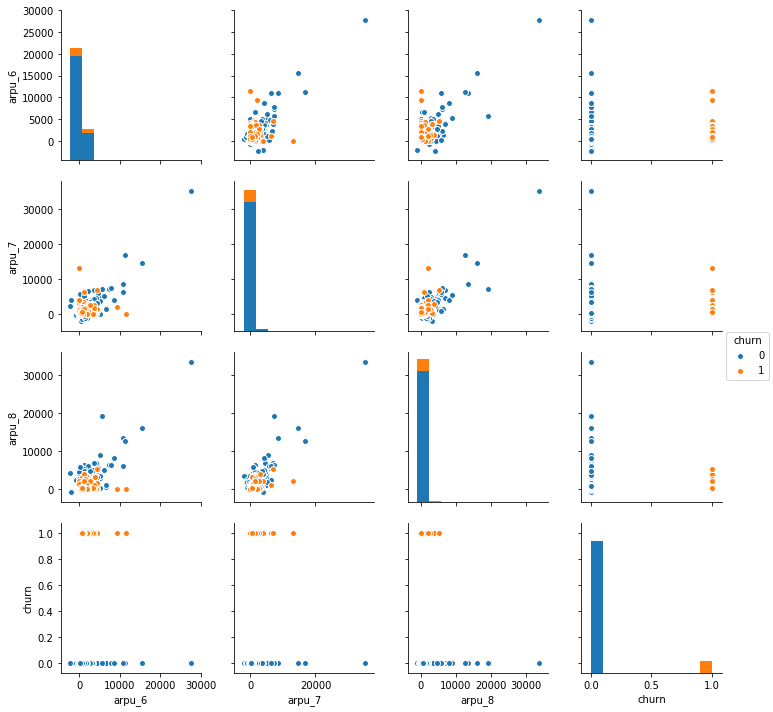

In [0]:
#Plotting Pair-Plot between ARPU data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['arpu_6','arpu_7','arpu_8','churn']],hue='churn')

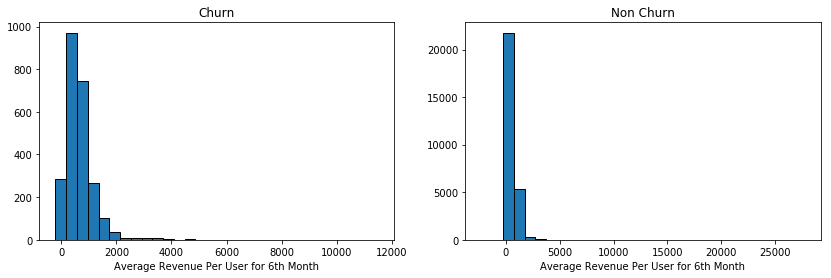

In [0]:
#Plotting histogram of ARPU data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['arpu_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Average Revenue Per User for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['arpu_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Average Revenue Per User for 6th Month')

plt.show()

### Conclusion

1) From the pair plots, we could infer that the ARPU gradually reducing from the 6th month for churn customers whereas it remains constant for non churn customers.

2) Also from the churn pair plots, we could see height of histogram is decreased as we go from 6th to 8th month whereas it remains the same for non churn customers.

### Voice usage within the same network

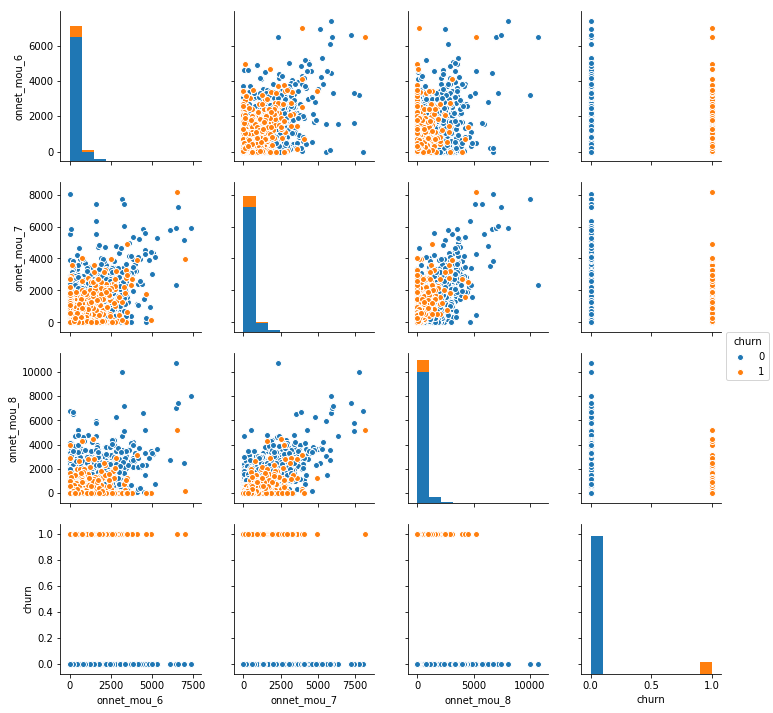

In [0]:
#Plotting Pair-Plot between same network voice calls data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['onnet_mou_6','onnet_mou_7','onnet_mou_8','churn']],hue='churn')

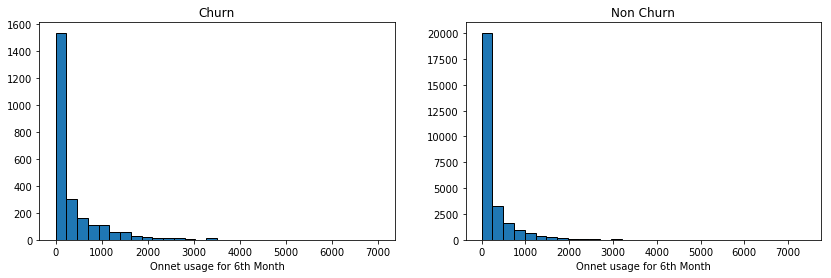

In [0]:
#Plotting histogram of same network voice calls data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['onnet_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Onnet usage for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['onnet_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Onnet usage for 6th Month')

plt.show()

### Conclusion

1) Here we could see the voice usage within the same network is good for both churn and non churn customers for the 6th and 7th months. From 8th month onwards, the usage starts dipping for churn customers.

2) The Histogram shows onnet usage is fairly good for both churn and non churn customers during the initial days.

### Voice usage across other networks

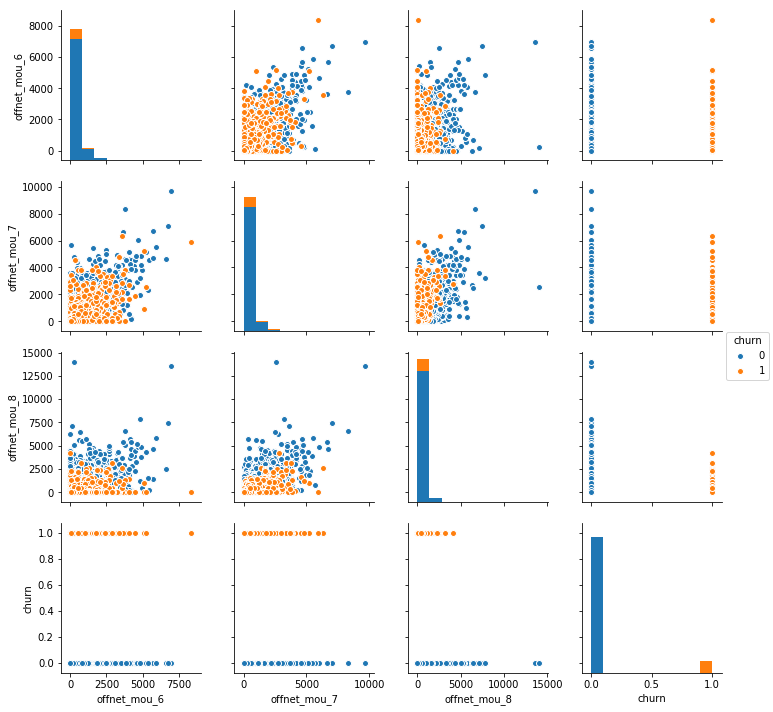

In [0]:
#Plotting Pair-Plot between other network voice calls data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['offnet_mou_6','offnet_mou_7','offnet_mou_8','churn']],hue='churn')

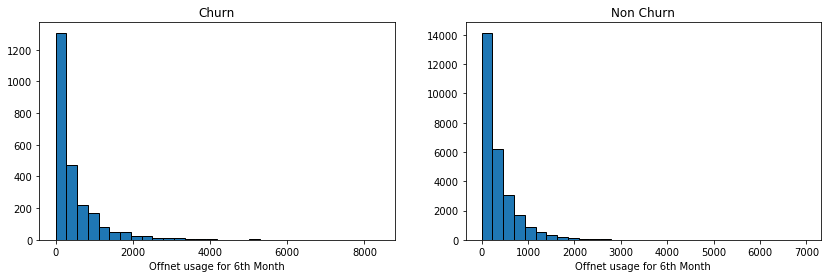

In [0]:
#Plotting histogram of other network voice calls data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['offnet_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Offnet usage for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['offnet_mou_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Offnet usage for 6th Month')

plt.show()

### Conclusion

1) Same as onnet calls, the offnet usage is also good for the initial months and starts dipping from the 8th month only for churn customers.

2) The churn plots clearly shows the reduction in offnet calls during 8th month.

### Number of times a customer recharged his number

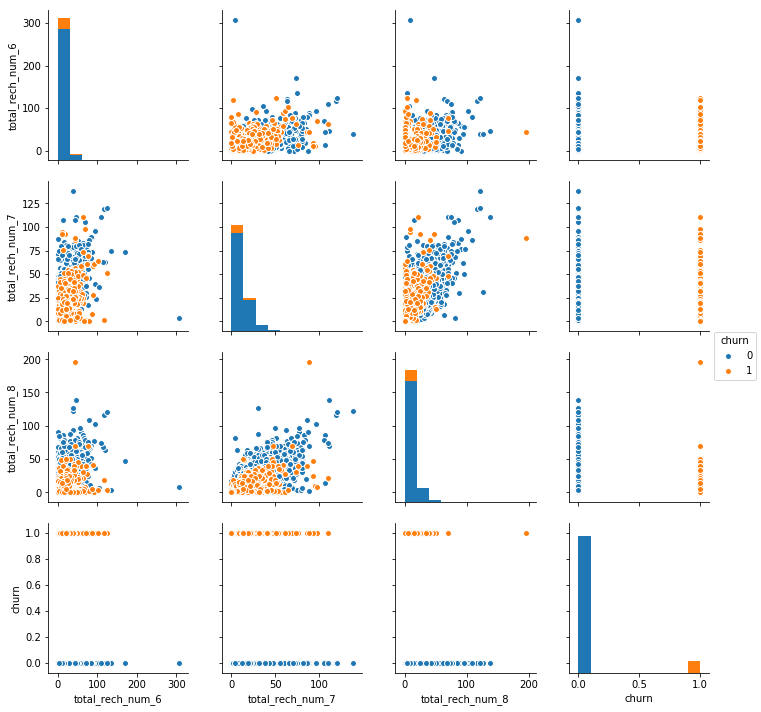

In [0]:
#Plotting Pair-Plot between recharge data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['total_rech_num_6','total_rech_num_7','total_rech_num_8','churn']],hue='churn')

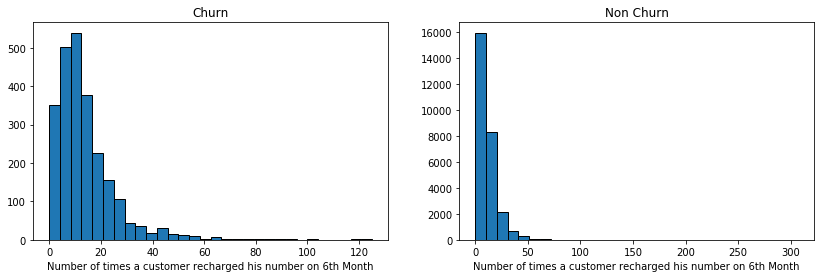

In [0]:
#Plotting histogram of recharge data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['total_rech_num_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Number of times a customer recharged his number on 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['total_rech_num_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Number of times a customer recharged his number on 6th Month')

plt.show()

### Conclusion

1) Here both the churn and Non churn customers have recharged a good number of times.

2) Compared to 6th month, the recharge count is slightly increased for the 7th month both for the churn and non churn customers.

3) After a good 7th month, the recharge count starts dipping for churn customers from the 8th month onwards.

### Total Recharge amount per customer for a month

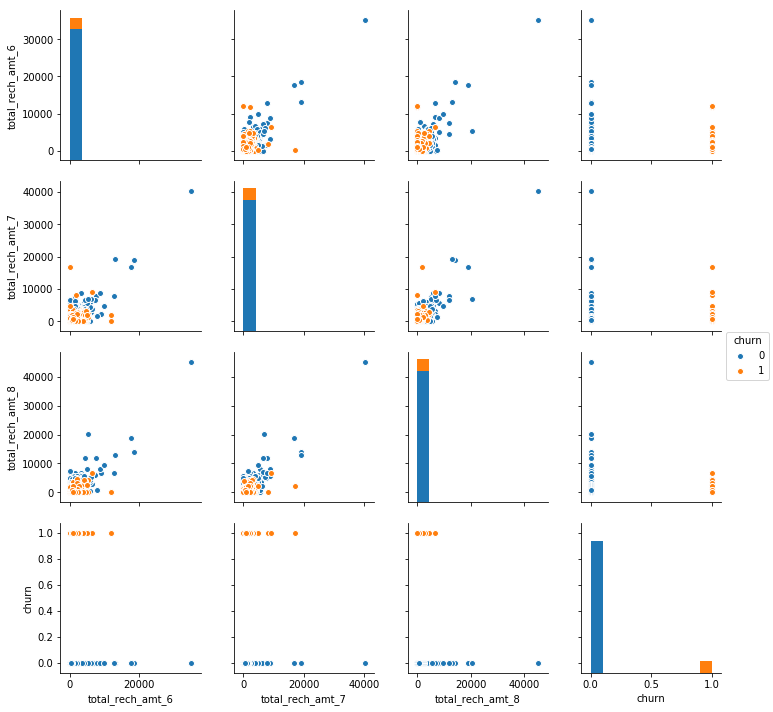

In [0]:
#Plotting Pair-Plot between recharge amount per month data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['total_rech_amt_6','total_rech_amt_7','total_rech_amt_8','churn']],hue='churn')

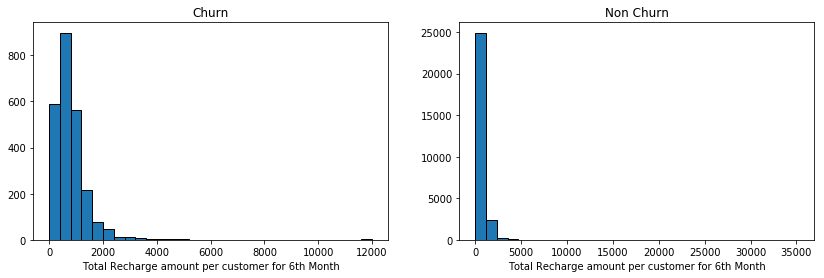

In [0]:
#Plotting histogram of recharge amount per month data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['total_rech_amt_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Total Recharge amount per customer for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['total_rech_amt_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Total Recharge amount per customer for 6th Month')

plt.show()

### Conclusion

1) From the plots, we could infer that the recharge amount is comparatively lower for churn customers when compared with Non churn customers for all the 3 months.

2) Also the recharge amount of churn customers is gradually reducing month on month

### Number of times a customer has done data recharge

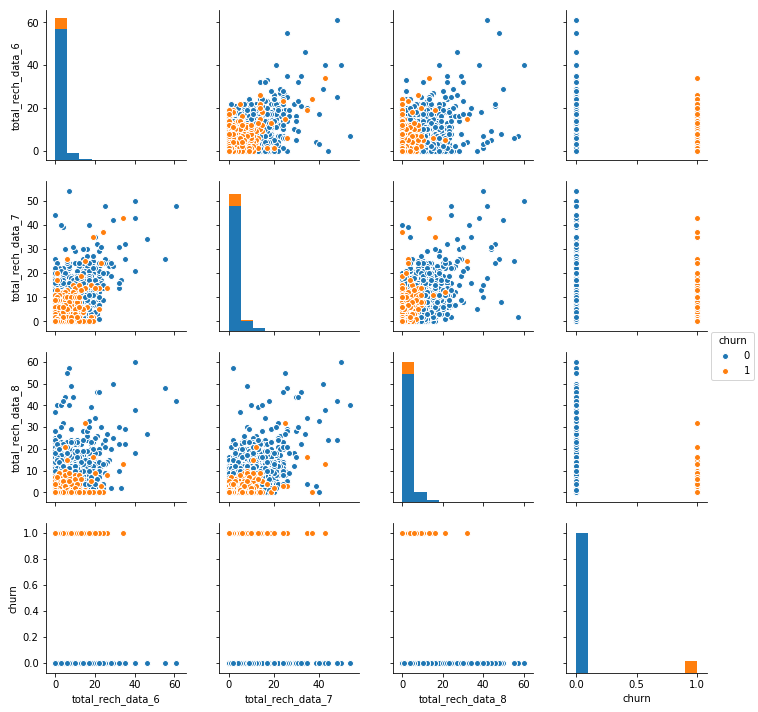

In [0]:
#Plotting Pair-Plot between recharge count data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['total_rech_data_6','total_rech_data_7','total_rech_data_8','churn']],hue='churn')

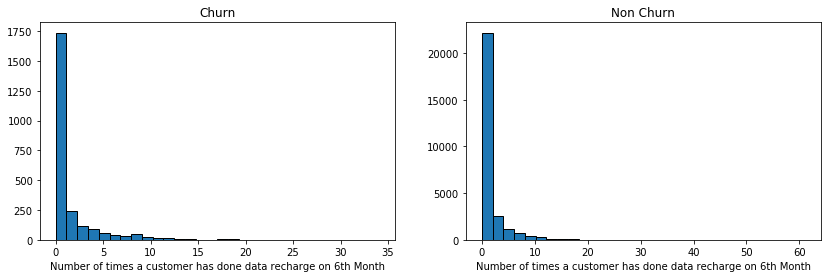

In [0]:
#Plotting histogram of recharge count data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['total_rech_data_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('Number of times a customer has done data recharge on 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['total_rech_data_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('Number of times a customer has done data recharge on 6th Month')

plt.show()

### Conclusion

1) Same as recharge count, here the data recharge count has also seen a minor spike on 7th month when compared to 6th month.

2) Then the data recharge count is reduced on 8th month.

3) Histogram shows Non churn customers has done more number of data recharges during the initial months.

### 2G Data usage in MB

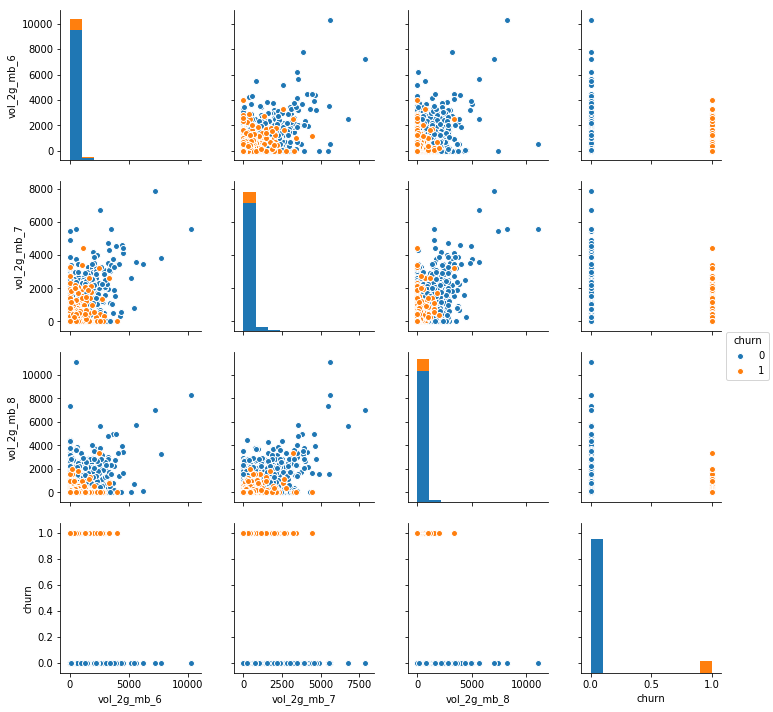

In [0]:
#Plotting Pair-Plot between 2G usage data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','churn']],hue='churn')

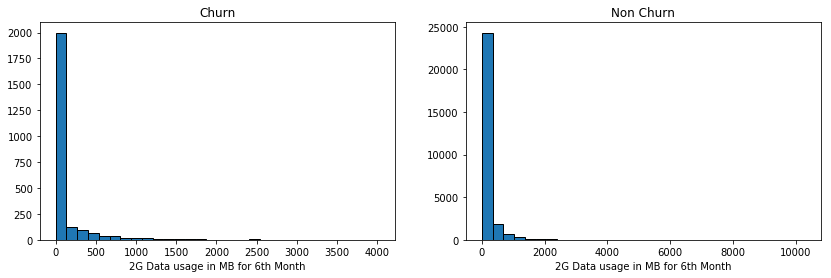

In [0]:
#Plotting histogram of 2G usage data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['vol_2g_mb_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('2G Data usage in MB for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['vol_2g_mb_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('2G Data usage in MB for 6th Month')

plt.show()

### Conclusion

1) 2G data usage is consistent for the first 2 months for both churn and non churn customers.

2) While non churn customers carry their consistency to the 8th month, the churn customers missed and so there is a reduction in data usage for churn customers for 8th month.

3) Histogram shows the usage is comparatively lower for churn customers during the 6th month.

### 3G Data usage in MB

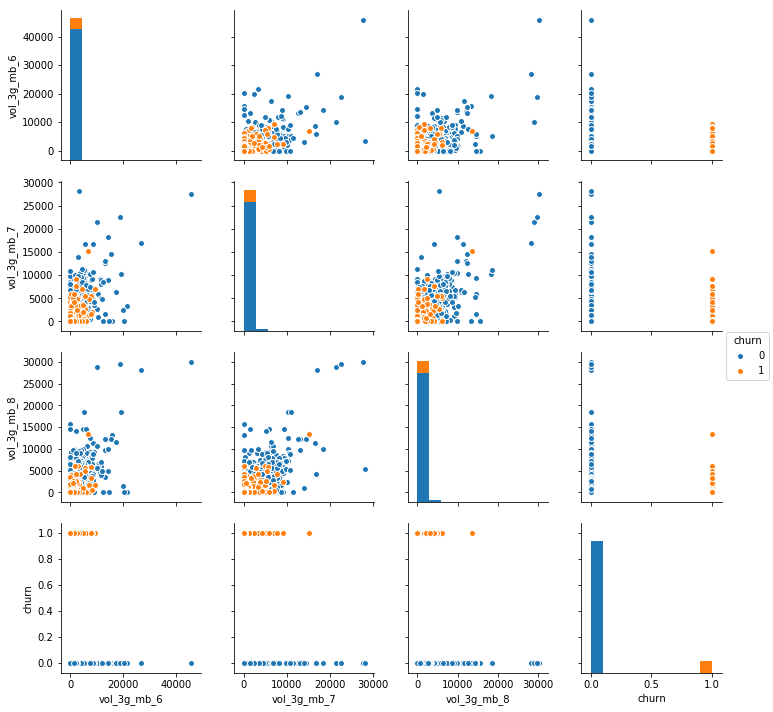

In [0]:
#Plotting Pair-Plot between 3G usage data of 6th, 7th and 8th months and churn flag.
sns.pairplot(data=top_customers_data[['vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','churn']],hue='churn')

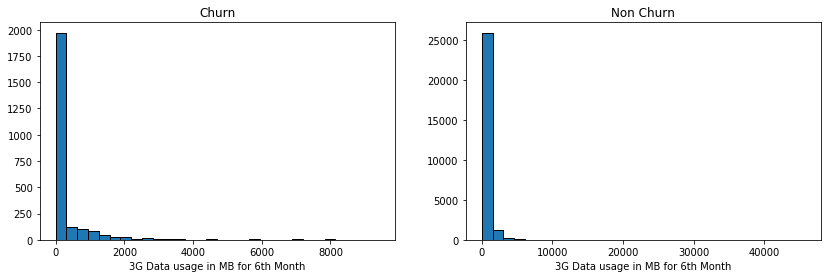

In [0]:
#Plotting histogram of 3G usage data of 6th month for churn and Non churn customers
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(14, 4))

plt.subplot(121)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==1]['vol_3g_mb_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Churn')
plt.xlabel('3G Data usage in MB for 6th Month')

plt.subplot(122)
hist, edges = np.histogram(top_customers_data[top_customers_data['churn']==0]['vol_3g_mb_6'], bins=30)
plt.bar(edges[:-1], hist, align="edge", ec="k", width=np.diff(edges))
plt.title('Non Churn')
plt.xlabel('3G Data usage in MB for 6th Month')

plt.show()

### Conclusion

1) The plot shows the 3G data usage is almost consistent across all the 3 months for both the churn and non churn customers.

2) The Histogram shows churn customers are slightly lagging in 3G data usage during the intial days compared to non churn customers.

## Summary of Exploratory data Analysis

We performed Exploratory Data Analysis with many features and have made observations which would help us in performing our prediction better and to achieve good accuracy. Here are few points we observed from the analysis :

The data is imbalanced as the churn customers are less than 10%. We have to deal with this imbalance as imbalanced data would have an impact on the model's performance.

Though there is some difference in few plots, one common observation we made across different plots is that the usage for unhappy or churn customers is gradually reducing month on month as we move from 6th month to 8th month. This shows that they are not happy with the services and they are highly likely to churn in the near future. The company should understand their concerns and try to retain them by resolving their concerns.

As far as the non churn customers are concerned, there is no significant difference in the usage behaviour across months for them. This shows that they are happy with the services and they are consistently clocking their usage.

Also we could hardly see outliers in the data and so we needn't deal with it.

## Feature Engineering

We understand from the above plots that the usage of unhappy or churn customers has been reducing with time. We would take the data of June,July and August for training the models. Hence the difference in usage between the August month and the previous months would be really useful in predicting the churn.

In [0]:
#Creating new features which shows the difference between the 8th month data and the average of 6th and 7th months' data
top_customers_data['arpu_diff'] = top_customers_data['arpu_8'] - (top_customers_data[['arpu_6' , 'arpu_7']].mean(axis=1))
top_customers_data['onnet_mou_diff'] = top_customers_data['onnet_mou_8'] - (top_customers_data[['onnet_mou_6' , 'onnet_mou_7']].mean(axis=1))
top_customers_data['offnet_mou_diff'] = top_customers_data['offnet_mou_8'] - (top_customers_data[['offnet_mou_6' , 'offnet_mou_7']].mean(axis=1))
top_customers_data['roam_ic_mou_diff'] = top_customers_data['roam_ic_mou_8'] - (top_customers_data[['roam_ic_mou_6' , 'roam_ic_mou_7']].mean(axis=1))
top_customers_data['roam_og_mou_diff'] = top_customers_data['roam_og_mou_8'] - (top_customers_data[['roam_og_mou_6' , 'roam_og_mou_7']].mean(axis=1))
top_customers_data['loc_og_mou_diff'] = top_customers_data['loc_og_mou_8'] - (top_customers_data[['loc_og_mou_6' , 'loc_og_mou_7']].mean(axis=1))
top_customers_data['std_og_mou_diff'] = top_customers_data['std_og_mou_8'] - (top_customers_data[['std_og_mou_6' , 'std_og_mou_7']].mean(axis=1))
top_customers_data['isd_og_mou_diff'] = top_customers_data['isd_og_mou_8'] - (top_customers_data[['isd_og_mou_6' , 'isd_og_mou_7']].mean(axis=1))
top_customers_data['spl_og_mou_diff'] = top_customers_data['spl_og_mou_8'] - (top_customers_data[['spl_og_mou_6' , 'spl_og_mou_7']].mean(axis=1))
top_customers_data['total_og_mou_diff'] = top_customers_data['total_og_mou_8'] - (top_customers_data[['total_og_mou_6' , 'total_og_mou_7']].mean(axis=1))
top_customers_data['loc_ic_mou_diff'] = top_customers_data['loc_ic_mou_8'] - (top_customers_data[['loc_ic_mou_6' , 'loc_ic_mou_7']].mean(axis=1))
top_customers_data['std_ic_mou_diff'] = top_customers_data['std_ic_mou_8'] - (top_customers_data[['std_ic_mou_6' , 'std_ic_mou_7']].mean(axis=1))
top_customers_data['isd_ic_mou_diff'] = top_customers_data['isd_ic_mou_8'] - (top_customers_data[['isd_ic_mou_6' , 'isd_ic_mou_7']].mean(axis=1))
top_customers_data['spl_ic_mou_diff'] = top_customers_data['spl_ic_mou_8'] - (top_customers_data[['spl_ic_mou_6' , 'spl_ic_mou_7']].mean(axis=1))
top_customers_data['total_ic_mou_diff'] = top_customers_data['total_ic_mou_8'] - (top_customers_data[['total_ic_mou_6' , 'total_ic_mou_7']].mean(axis=1))
top_customers_data['total_rech_num_diff'] = top_customers_data['total_rech_num_8'] - (top_customers_data[['total_rech_num_6' , 'total_rech_num_7']].mean(axis=1))
top_customers_data['total_rech_amt_diff'] = top_customers_data['total_rech_amt_8'] - (top_customers_data[['total_rech_amt_6' , 'total_rech_amt_7']].mean(axis=1))
top_customers_data['max_rech_amt_diff'] = top_customers_data['max_rech_amt_8'] - (top_customers_data[['max_rech_amt_6' , 'max_rech_amt_7']].mean(axis=1))
top_customers_data['total_rech_data_diff'] = top_customers_data['total_rech_data_8'] - (top_customers_data[['total_rech_data_6' , 'total_rech_data_7']].mean(axis=1))
top_customers_data['max_rech_data_diff'] = top_customers_data['max_rech_data_8'] - (top_customers_data[['max_rech_data_6' , 'max_rech_data_7']].mean(axis=1))
top_customers_data['av_rech_amt_data_diff'] = top_customers_data['av_rech_amt_data_8'] - (top_customers_data[['av_rech_amt_data_6' , 'av_rech_amt_data_7']].mean(axis=1))
top_customers_data['vol_2g_mb_diff'] = top_customers_data['vol_2g_mb_8'] - (top_customers_data[['vol_2g_mb_6' , 'vol_2g_mb_7']].mean(axis=1))
top_customers_data['vol_3g_mb_diff'] = top_customers_data['vol_3g_mb_8'] - (top_customers_data[['vol_3g_mb_6' , 'vol_3g_mb_7']].mean(axis=1))

We can't use date fields as is. So we will extract the date from the date fields.

In [0]:
#Converting into datetime format
top_customers_data['date_of_last_rech_6'] = pd.to_datetime(top_customers_data['date_of_last_rech_6'])
top_customers_data['date_of_last_rech_7'] = pd.to_datetime(top_customers_data['date_of_last_rech_7'])
top_customers_data['date_of_last_rech_8'] = pd.to_datetime(top_customers_data['date_of_last_rech_8'])
top_customers_data['date_of_last_rech_data_6'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_6'])
top_customers_data['date_of_last_rech_data_7'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_7'])
top_customers_data['date_of_last_rech_data_8'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_8'])

In [0]:
#Extracting the date from the date columns
top_customers_data['last_rech_date_6'] = top_customers_data['date_of_last_rech_6'].dt.day
top_customers_data['last_rech_date_7'] = top_customers_data['date_of_last_rech_7'].dt.day
top_customers_data['last_rech_date_8'] = top_customers_data['date_of_last_rech_8'].dt.day
top_customers_data['last_data_rech_date_6'] = top_customers_data['date_of_last_rech_data_6'].dt.day
top_customers_data['last_data_rech_date_7'] = top_customers_data['date_of_last_rech_data_7'].dt.day
top_customers_data['last_data_rech_date_8'] = top_customers_data['date_of_last_rech_data_8'].dt.day

In [0]:
#The derived date columns may contain NAN values, so we will impute them with 0 as we did for other columns.
derived_date_cols = ['last_rech_date_6','last_rech_date_7','last_rech_date_8',
                    'last_data_rech_date_6','last_data_rech_date_7','last_data_rech_date_8']

top_customers_data[derived_date_cols] = top_customers_data[derived_date_cols].apply(lambda x: x.fillna(0))

As we derived the date information from the date type columns, we can remove them as we can't use object type columns for training.

In [0]:
#Dropping the date columns
top_customers_data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8',
         'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8',], axis=1, inplace=True)

As we use the date of June,July and August months for training, we have to remove columns corresponding to September month to prevent Data leakage issue.

In [0]:
#Filtering the columns corresponding to 9th month
cols_9th_month = top_customers_data.filter(regex='_9|sep', axis = 1).columns
cols_9th_month

Index(['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9',
       'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9',
       'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9',
       'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9',
       'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9',
       'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9',
       'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
       'date_of_last_rech_9', 'last_day_rch_amt_9', 'date_of_last_rech_data_9',
       'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9',
       'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9',
       'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9',
       'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9

In [0]:
#Dropping the 9th month columns to avoid data leakage issue
top_customers_data = top_customers_data.drop(cols_9th_month, axis=1)

As discussed in the previous section, Mobile number is unique across customers and is of no use. Hence dropping the column.

In [0]:
#Dropping the mobile number column
top_customers_data.drop(['mobile_number'], axis=1, inplace=True)
data_final = top_customers_data

In [0]:
#Shape of data after Preprocessing and Feature Engineering
data_final.shape

(30001, 181)

# Models

In [0]:
# importing required libraries
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import f1_score
from tqdm import tqdm
import xgboost as xgb

In [0]:
#Segregating the label column from other columns
y = data_final['churn'].values
X = data_final.drop(['churn'], axis=1)

In [0]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(24000, 180) (24000,)
(6001, 180) (6001,)


In [0]:
#Random upsampling using SMOTE
#Source : https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=2)
X_train, y_train = smote.fit_sample(X_train, y_train.ravel())

print(X_train.shape, y_train.shape)

print("Count of label 0 :",sum(y_train == 0))
print("Count of label 1 :",sum(y_train == 1))

(44094, 180) (44094,)
Count of label 0 : 22047
Count of label 1 : 22047


## Function to plot the confusion matrix 

In [0]:
#function to plot confusion matric
import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
plt.rcParams["font.family"] = 'DejaVu Sans'

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    
    """This function is used to plot the confusion Matrix."""
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

## Function to calculate the probability estimates

In [0]:
#Function to calculate the probability estimates
def batch_predict(clf, data):
    
    """ In roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class and
    not the predicted outputs. So this function is to calculate the probability estimates."""

    y_data_pred = []
    tr_loop = data.shape[0] - data.shape[0]%1000

    for i in range(0, tr_loop, 1000):
        y_data_pred.extend(clf.predict_proba(data[i:i+1000])[:,1])

    if data.shape[0]%1000 !=0:
        y_data_pred.extend(clf.predict_proba(data[tr_loop:])[:,1])
    
    return y_data_pred

## Function to arrive at Predictions

In [0]:
def find_best_threshold(threshould, fpr, tpr):
    
    """This function is to calculate the threshold value which will give the least FPR."""
    
    t = threshould[np.argmax(tpr*(1-fpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    
    """This function is used to make predictions from probility estimates."""
    
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

## K-Nearest Neighbour

### Hyper-Parameter Tuning

100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [14:11<00:00, 170.30s/it]


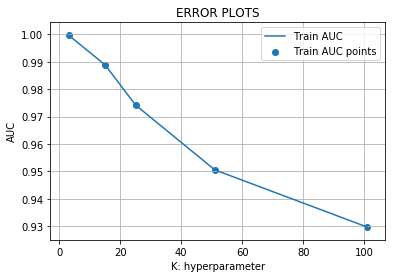

In [0]:
from sklearn.neighbors import KNeighborsClassifier

train_auc = []

K = [3, 15, 25, 51, 101]
for i in tqdm(K):
    neigh = KNeighborsClassifier(n_neighbors=i, n_jobs=-1)
    neigh.fit(X_train, y_train)

    y_train_pred = batch_predict(neigh, X_train)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(K, train_auc, label='Train AUC')

plt.scatter(K, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

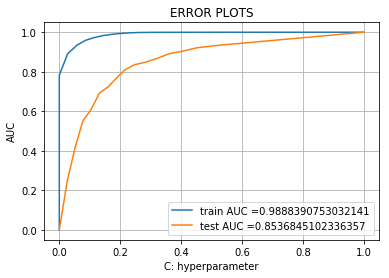

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_k = 15

neigh = KNeighborsClassifier(n_neighbors=best_k, n_jobs=-1)
neigh.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(neigh, X_train)    
y_test_pred = batch_predict(neigh, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.8803341329647297 for threshold 0.867


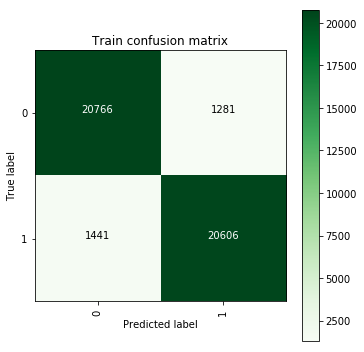

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

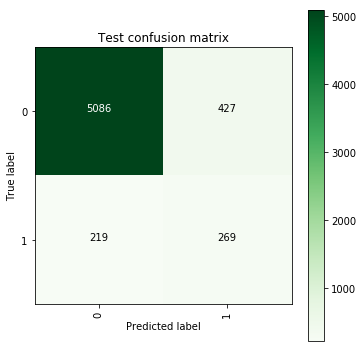

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8923512747875354
ROC for test data : 0.8536845102336357


## Logistic Regression

### Hyper-Parameter Tuning

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:08<00:00, 12.80s/it]


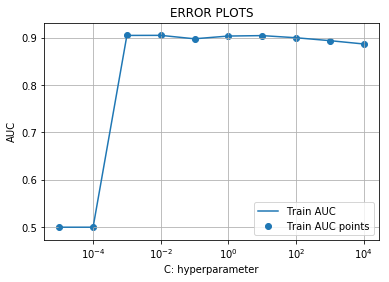

In [0]:
#Hyper-parameter tuning
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

train_auc = []

C = [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(C):    
    LR = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf = LR.fit(X_train, y_train)
    calibrator = CalibratedClassifierCV(clf, method="sigmoid")
    model=calibrator.fit(X_train, y_train)

    y_train_pred = batch_predict(model, X_train)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(C, train_auc, label='Train AUC')

plt.scatter(C, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.xscale("log")
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

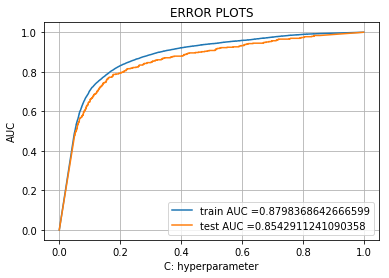

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_alpha = 0.01

LR = SGDClassifier(alpha=best_alpha, penalty='l2', loss='log', random_state=42)
clf = LR.fit(X_train, y_train)
calibrator = CalibratedClassifierCV(clf, method="sigmoid")
model=calibrator.fit(X_train, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(LR, X_train)    
y_test_pred = batch_predict(LR, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.6669754286463583 for threshold 0.0


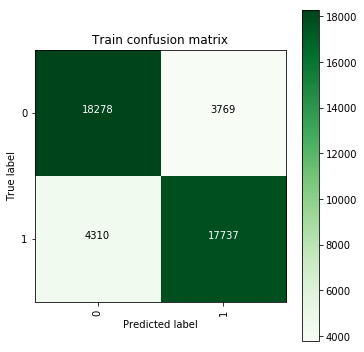

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

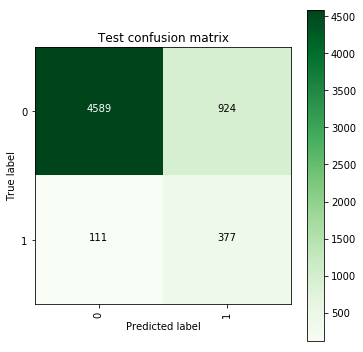

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8275287452091318
ROC for test data : 0.8542911241090358


## Linear SVM

### Hyper-Parameter Tuning

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:23<00:00,  2.35s/it]


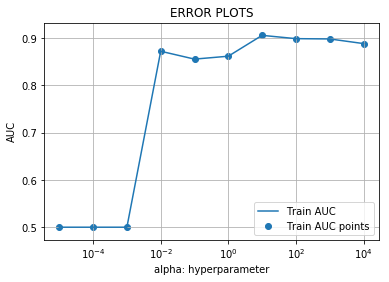

In [0]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV

train_auc = []
alpha = [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(alpha):
    SVM = SGDClassifier(loss='hinge', class_weight = 'balanced', alpha=i)
    clf = SVM.fit(X_train, y_train)
    calibrator = CalibratedClassifierCV(clf, cv='prefit')
    model=calibrator.fit(X_train, y_train)

    y_train_pred = batch_predict(model, X_train)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(alpha, train_auc, label='Train AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.xscale("log")
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

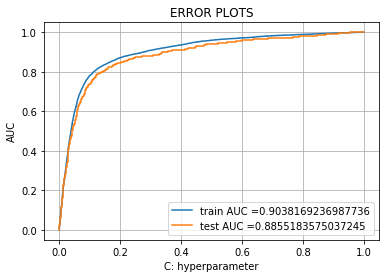

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_alpha = 10

SVM = SGDClassifier(loss='hinge', class_weight = 'balanced', alpha=best_alpha)
clf = SVM.fit(X_train, y_train)
calibrator = CalibratedClassifierCV(clf, cv='prefit')
model=calibrator.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_train)    
y_test_pred = batch_predict(model, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.7134941569727018 for threshold 0.582


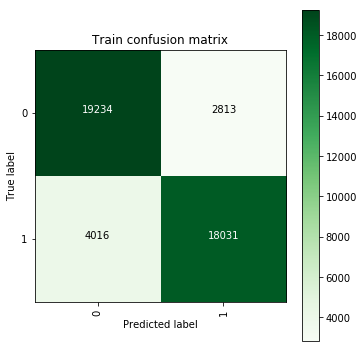

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

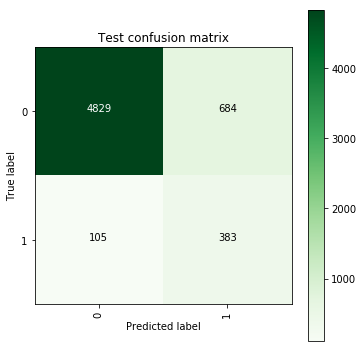

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8685219130144975
ROC for test data : 0.8855183575037245


## Decision Trees

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[1,5,10,50],
              'min_samples_split':[5,10,100,500]} 

DT = DecisionTreeClassifier()
gsv = GridSearchCV(estimator = DT, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:   13.7s
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed:   35.2s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:  1.3min remaining:    0.0s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:  1.3min finished


best values after hyperparameter tuning :  {'max_depth': 10, 'min_samples_split': 5}


## Testing the performance of the model on test data, plotting ROC Curves

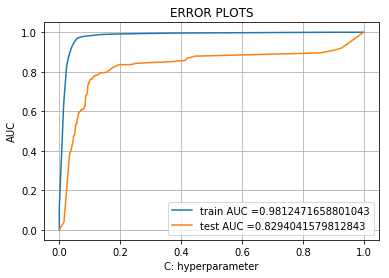

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_max_depth = 10
best_min_samples_split = 5

DT = DecisionTreeClassifier(max_depth=best_max_depth, min_samples_split=best_min_samples_split)
DT.fit(X_train, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(DT, X_train)    
y_test_pred = batch_predict(DT, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9118760824940827 for threshold 0.548


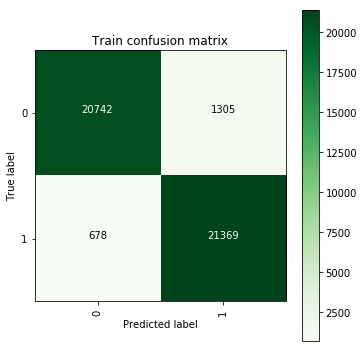

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

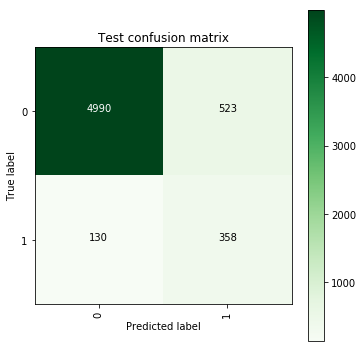

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8911848025329112
ROC for test data : 0.8294041579812843


## Random Forest

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[2, 3, 4, 5, 6, 8, 10],
              'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]} 

RF = RandomForestClassifier(class_weight='balanced')
gsv = GridSearchCV(estimator = RF, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:   57.0s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-2)]: Done  44 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-2)]: Done  55 tasks      | elapsed: 20.1min
[Parallel(n_jobs=-2)]: Done  66 tasks      | elapsed: 23.6min
[Parallel(n_jobs=-2)]: Done  79 tasks      | elapsed: 32.4min
[Parallel(n_jobs=-2)]: Done  92 tasks      | elapsed: 39.7min
[Parallel(n_jobs=-2)]: Done 107 tasks      | elapsed: 50.7min
[Parallel(n_jobs=-2)]: Done 122 tasks      | elapsed: 73.1min
[Parallel(n_jobs=-2)]: Done 139 tasks      | elapsed: 91.6min
[Parallel(n_jobs=-2)]: Done 156 tasks      | elapsed: 10

best values after hyperparameter tuning :  {'max_depth': 10, 'n_estimators': 200}


## Testing the performance of the model on test data, plotting ROC Curves

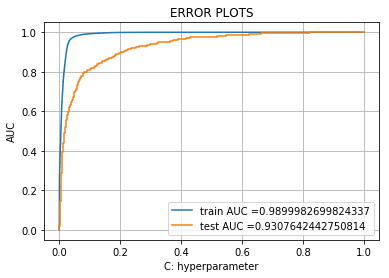

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_n_estimators = 200
best_max_depth = 10

RF = RandomForestClassifier(class_weight='balanced', n_estimators=best_n_estimators, max_depth=best_max_depth)
RF.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(RF, X_train)    
y_test_pred = batch_predict(RF, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9307106064589118 for threshold 0.517


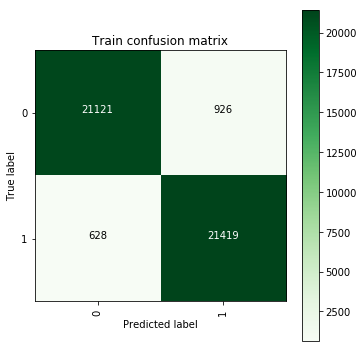

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

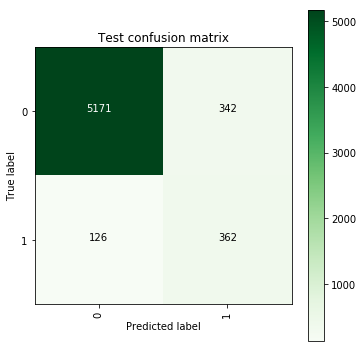

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.9220129978336944
ROC for test data : 0.9307642442750814


## XGBoost

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[2, 3, 4, 5, 6, 8, 10],
              'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]} 

XGB = xgb.XGBClassifier()
gsv = GridSearchCV(estimator = XGB, param_grid=parameters, cv=3, verbose=10, n_jobs=-1)
gsv.fit(X_train, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    6.5s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   21.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed: 10.1min
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed: 20.8min
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed: 36.1min
[Parallel(n_jobs=-1)]: Done  57 tasks      | elapsed: 42.8min
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed: 57.5min
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed: 76.1min
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed: 105.4min
[Parallel(n_jobs=-1)]: Done 109 tasks      | elapsed: 122.4min
[Parallel(n_jobs=-1)]: Done 124 tasks      | elapsed: 159.9min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:

best values after hyperparameter tuning :  {'max_depth': 10, 'n_estimators': 50}


## Testing the performance of the model on test data, plotting ROC Curves

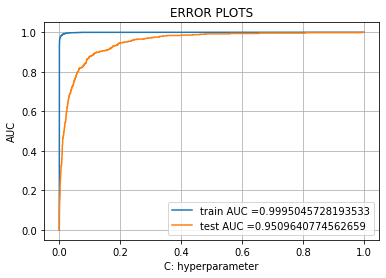

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_n_estimators = 50
best_max_depth = 10

XGB = xgb.XGBClassifier(n_estimators=best_n_estimators, max_depth=best_max_depth)
XGB.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(XGB, X_train)    
y_test_pred = batch_predict(XGB, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9788054152615493 for threshold 0.247


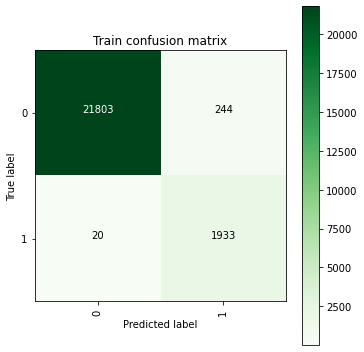

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

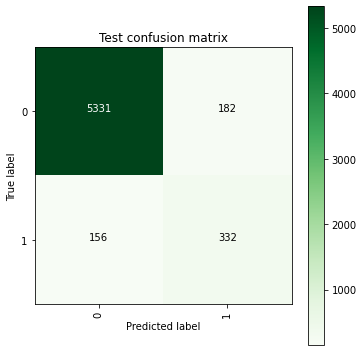

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.9436760539910015
ROC for test data : 0.9509640774562659


# Models using Recursive Feature Elimination

Recursive Feature Elimination doesn't support KNN and XGBoost. So we will apply the same to other models - Logistic Regression, Linear SVM, Decision Trees and Random Forest

## Logistic Regression

### Feature Selection using Recursive Feature Elimination

In [0]:
#https://towardsdatascience.com/feature-selection-in-python-recursive-feature-elimination-19f1c39b8d15
from sklearn.feature_selection import RFECV

rfc = SGDClassifier(loss='log', penalty='l2', random_state=42)
rfecv = RFECV(estimator=rfc, step=10, cv=3, scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=3,
      estimator=SGDClassifier(alpha=0.0001, average=False, class_weight=None,
                              early_stopping=False, epsilon=0.1, eta0=0.0,
                              fit_intercept=True, l1_ratio=0.15,
                              learning_rate='optimal', loss='log',
                              max_iter=1000, n_iter_no_change=5, n_jobs=None,
                              penalty='l2', power_t=0.5, random_state=42,
                              shuffle=True, tol=0.001, validation_fraction=0.1,
                              verbose=0, warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=10,
      verbose=0)

In [0]:
#Printing the number of optimal columns
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 30


In [0]:
#Retaining the columns given by RFECV and dropping the remaining ones
X_train_lr = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)
X_test_lr = X_test.drop(X_test.columns[np.where(rfecv.support_ == False)[0]], axis=1)

### Hyper-Parameter Tuning

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:35<00:00,  3.52s/it]


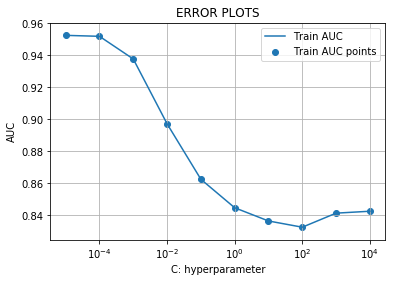

In [0]:
#Hyper-parameter tuning
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

train_auc = []

C = [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(C):    
    LR = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf = LR.fit(X_train_lr, y_train)
    calibrator = CalibratedClassifierCV(clf, method="sigmoid")
    model=calibrator.fit(X_train_lr, y_train)

    y_train_pred = batch_predict(model, X_train_lr)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(C, train_auc, label='Train AUC')

plt.scatter(C, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.xscale("log")
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

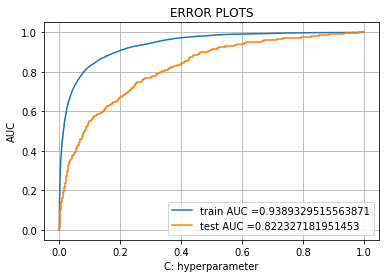

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_alpha = 0.001

LR = SGDClassifier(alpha=best_alpha, penalty='l2', loss='log', random_state=42)
clf = LR.fit(X_train_lr, y_train)
calibrator = CalibratedClassifierCV(clf, method="sigmoid")
model=calibrator.fit(X_train_lr, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(LR, X_train_lr)    
y_test_pred = batch_predict(LR, X_test_lr)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.7486994126809363 for threshold 0.679


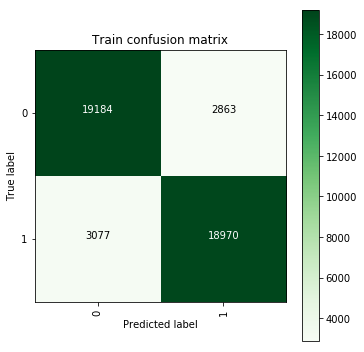

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

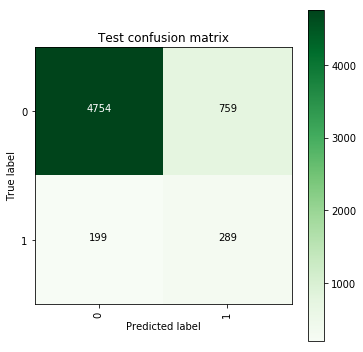

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8403599400099984
ROC for test data : 0.822327181951453


## Linear SVM

### Feature Selection using Recursive Feature Elimination

In [0]:
from sklearn.feature_selection import RFECV

rfc = SGDClassifier(loss='hinge', class_weight = 'balanced', random_state=42)
rfecv = RFECV(estimator=rfc, step=10, cv=3, scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=3,
      estimator=SGDClassifier(alpha=0.0001, average=False,
                              class_weight='balanced', early_stopping=False,
                              epsilon=0.1, eta0=0.0, fit_intercept=True,
                              l1_ratio=0.15, learning_rate='optimal',
                              loss='hinge', max_iter=1000, n_iter_no_change=5,
                              n_jobs=None, penalty='l2', power_t=0.5,
                              random_state=42, shuffle=True, tol=0.001,
                              validation_fraction=0.1, verbose=0,
                              warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=10,
      verbose=0)

In [0]:
#Printing the number of optimal columns
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 40


In [0]:
#Retaining the columns given by RFECV and dropping the remaining ones
X_train_svm = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)
X_test_svm = X_test.drop(X_test.columns[np.where(rfecv.support_ == False)[0]], axis=1)

### Hyper-Parameter Tuning

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.04it/s]


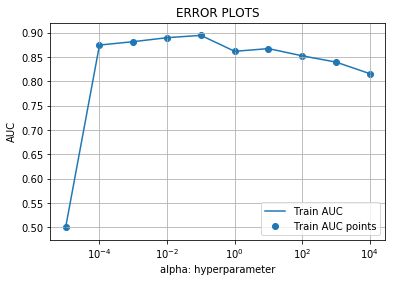

In [0]:
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import roc_auc_score
from sklearn.calibration import CalibratedClassifierCV

train_auc = []
alpha = [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(alpha):
    SVM = SGDClassifier(loss='hinge', class_weight = 'balanced', alpha=i)
    clf = SVM.fit(X_train_svm, y_train)
    calibrator = CalibratedClassifierCV(clf, cv='prefit')
    model=calibrator.fit(X_train_svm, y_train)

    y_train_pred = batch_predict(model, X_train_svm)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(alpha, train_auc, label='Train AUC')

plt.scatter(alpha, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("alpha: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.xscale("log")
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

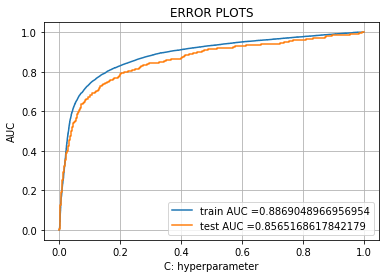

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_alpha = 0.1

SVM = SGDClassifier(loss='hinge', class_weight = 'balanced', alpha=best_alpha)
clf = SVM.fit(X_train_svm, y_train)
calibrator = CalibratedClassifierCV(clf, cv='prefit')
model=calibrator.fit(X_train_svm, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(model, X_train_svm)    
y_test_pred = batch_predict(model, X_test_svm)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.6762084034654343 for threshold 0.585


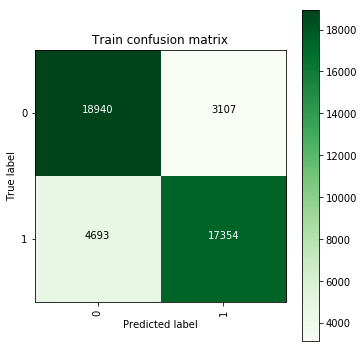

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

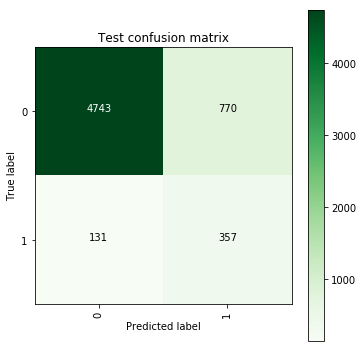

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8498583569405099
ROC for test data : 0.8565168617842179


## Decision Trees

### Feature Selection using Recursive Feature Elimination

In [0]:
from sklearn.feature_selection import RFECV

rfc = DecisionTreeClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=10, cv=3, scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=3,
      estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                       criterion='gini', max_depth=None,
                                       max_features=None, max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       presort='deprecated', random_state=101,
                                       splitter='best'),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=10,
      verbose=0)

In [0]:
#Printing the nnumber of optimal columns
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 60


In [0]:
#Retaining the columns given by RFECV and dropping the remaining ones
X_train_dt = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)
X_test_dt = X_test.drop(X_test.columns[np.where(rfecv.support_ == False)[0]], axis=1)

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[1,5,10,50],
              'min_samples_split':[5,10,100,500]} 

DT = DecisionTreeClassifier()
gsv = GridSearchCV(estimator = DT, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train_dt, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:   32.6s remaining:    0.0s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:   32.6s finished


best values after hyperparameter tuning :  {'max_depth': 10, 'min_samples_split': 5}


## Testing the performance of the model on test data, plotting ROC Curves

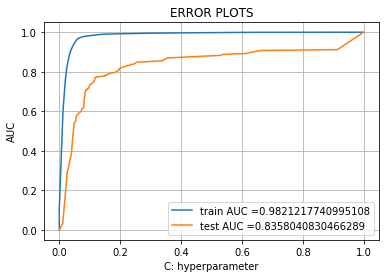

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_max_depth = 10
best_min_samples_split = 5

DT = DecisionTreeClassifier(max_depth=best_max_depth, min_samples_split=best_min_samples_split)
DT.fit(X_train_dt, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(DT, X_train_dt)    
y_test_pred = batch_predict(DT, X_test_dt)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9087866646030142 for threshold 0.571


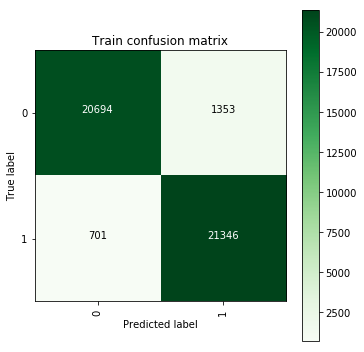

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

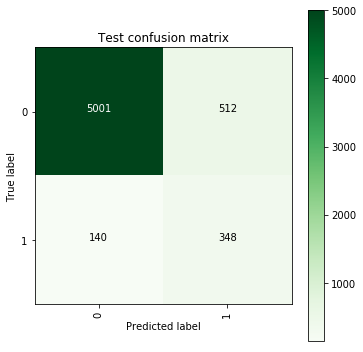

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.891351441426429
ROC for test data : 0.8358040830466289


## Random Forest

### Feature Selection using Recursive Feature Elimination

In [0]:
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

rfc = RandomForestClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=10, cv=3, scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=3,
      estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                       class_weight=None, criterion='gini',
                                       max_depth=None, max_features='auto',
                                       max_leaf_nodes=None, max_samples=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       n_estimators=100, n_jobs=None,
                                       oob_score=False, random_state=101,
                                       verbose=0, warm_start=False),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=10,
      verbose=0)

In [0]:
#Printing the number of optimal columns
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 160


In [0]:
#Retaining the columns given by RFECV and dropping the remaining ones
X_train_rf = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)
X_test_rf = X_test.drop(X_test.columns[np.where(rfecv.support_ == False)[0]], axis=1)

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[2, 3, 4, 5, 6, 8, 10],
              'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]} 

RF = RandomForestClassifier(class_weight='balanced')
gsv = GridSearchCV(estimator = RF, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train_rf, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:   52.9s
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-2)]: Done  44 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-2)]: Done  55 tasks      | elapsed: 10.3min
[Parallel(n_jobs=-2)]: Done  66 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-2)]: Done  79 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-2)]: Done  92 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-2)]: Done 107 tasks      | elapsed: 24.7min
[Parallel(n_jobs=-2)]: Done 122 tasks      | elapsed: 31.8min
[Parallel(n_jobs=-2)]: Done 139 tasks      | elapsed: 37.7min
[Parallel(n_jobs=-2)]: Done 156 tasks      | elapsed: 44

best values after hyperparameter tuning :  {'max_depth': 10, 'n_estimators': 1000}


## Testing the performance of the model on test data, plotting ROC Curves

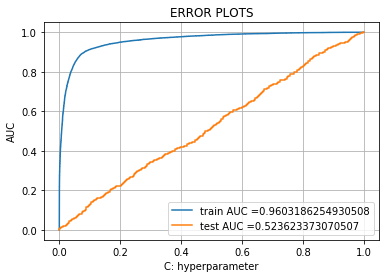

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_n_estimators = 1000
best_max_depth = 10

RF = RandomForestClassifier(class_weight='balanced', n_estimators=best_n_estimators, max_depth=best_max_depth)
RF.fit(X_train_rf, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(RF, X_train_rf)    
y_test_pred = batch_predict(RF, X_test_rf)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.8261097935339625 for threshold 0.535


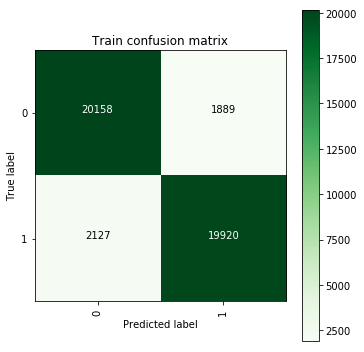

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

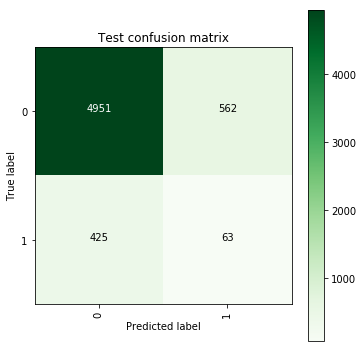

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8355274120979836
ROC for test data : 0.523623373070507


## Stacking Model

Here we are using X_train to train the metaclassifier and X_test to test the metaclassifier. X_train is further divided into T1 and T2. T1 is used to train the base models and T2 is used to compute predictions using which we will train the metaclassifier. Similarly X_test is further divided into T3 and T4. T3 is used to train the base models and T4 is used to compute predictions using which we will test the accuracy of metaclassifier. 

### Generating Row Samples with Replacement

In [0]:
#Converting labels into a dataframe in order to concatenate with X_train
Y_train_df = pd.DataFrame(data=y_train, columns = ['churn'])

print(X_train.shape)
print(Y_train_df.shape)

(44094, 180)
(44094, 1)


In [0]:
#Concatenating X_train with y_train(labels)
Train_data = pd.concat([X_train,Y_train_df], axis=1)

print(Train_data.shape)

(44094, 181)


In [0]:
#Splitting the train dataset into 2 parts,one for training the base models and another for computing predictions from the models.
T1 = Train_data.sample(frac=0.8, random_state=200)
T2 = Train_data.drop(T1.index)

print(T1.shape)
print(T2.shape)

(35275, 181)
(8819, 181)


In [0]:
#Generating 10 random samples from T1 dataset of size 20k with replacement
S1 = T1.sample(n = 20000, replace = True, axis = 0) 
S2 = T1.sample(n = 20000, replace = True, axis = 0) 
S3 = T1.sample(n = 20000, replace = True, axis = 0) 
S4 = T1.sample(n = 20000, replace = True, axis = 0) 
S5 = T1.sample(n = 20000, replace = True, axis = 0) 
S6 = T1.sample(n = 20000, replace = True, axis = 0) 
S7 = T1.sample(n = 20000, replace = True, axis = 0) 
S8 = T1.sample(n = 20000, replace = True, axis = 0) 
S9 = T1.sample(n = 20000, replace = True, axis = 0) 
S10 = T1.sample(n = 20000, replace = True, axis = 0)
S11 = T1.sample(n = 20000, replace = True, axis = 0) 
S12 = T1.sample(n = 20000, replace = True, axis = 0) 
S13 = T1.sample(n = 20000, replace = True, axis = 0) 
S14 = T1.sample(n = 20000, replace = True, axis = 0) 
S15 = T1.sample(n = 20000, replace = True, axis = 0)

In [0]:
#Defining the classifiers or models
clf1 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf2 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf3 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf4 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf5 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf6 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf7 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf8 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf9 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf10 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf11 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf12 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf13 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf14 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf15 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
meta_clf = xgb.XGBClassifier(n_estimators=50, max_depth=10)

In [0]:
#Segregating the label column from other columns for each sample
y1 = S1['churn'].values
X1 = S1.drop(['churn'], axis=1)

y2 = S2['churn'].values
X2 = S2.drop(['churn'], axis=1)

y3 = S3['churn'].values
X3 = S3.drop(['churn'], axis=1)

y4 = S4['churn'].values
X4 = S4.drop(['churn'], axis=1)

y5 = S5['churn'].values
X5 = S5.drop(['churn'], axis=1)

y6 = S6['churn'].values
X6 = S6.drop(['churn'], axis=1)

y7 = S7['churn'].values
X7 = S7.drop(['churn'], axis=1)

y8 = S8['churn'].values
X8 = S8.drop(['churn'], axis=1)

y9 = S9['churn'].values
X9 = S9.drop(['churn'], axis=1)

y10 = S10['churn'].values
X10 = S10.drop(['churn'], axis=1)

y11 = S11['churn'].values
X11 = S11.drop(['churn'], axis=1)

y12 = S12['churn'].values
X12 = S12.drop(['churn'], axis=1)

y13 = S13['churn'].values
X13 = S13.drop(['churn'], axis=1)

y14 = S14['churn'].values
X14 = S14.drop(['churn'], axis=1)

y15 = S15['churn'].values
X15 = S15.drop(['churn'], axis=1)

### Training and computing Predictions using base models

In [0]:
#Training each model with different sample
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
X = [X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15]
y = [y1,y2,y3,y4,y5,y6,y7,y8,y9,y10,y11,y12,y13,y14,y15]

for i in range(0,15):
    classifier = classifiers[i]
    classifier.fit(X[i], y[i])
    classifiers[i] = classifier

In [0]:
#Segregating the label column from other columns for T2 dataset
y_te = T2['churn'].values
X_te = T2.drop(['churn'], axis=1)

In [0]:
#Computing predictions using T2 dataset
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
dict = {}

for i in range(0,15):
    classifier = classifiers[i]
    dict["y_pred_{0}".format(i)] = classifier.predict(X_te)

In [0]:
#Building a dataframe with the predictions
pred_df = pd.DataFrame(data=np.hstack((dict['y_pred_0'][:,None], 
                                           dict['y_pred_1'][:,None],
                                           dict['y_pred_2'][:,None],                                         
                                           dict['y_pred_3'][:,None],
                                           dict['y_pred_4'][:,None],
                                           dict['y_pred_5'][:,None],
                                           dict['y_pred_6'][:,None],
                                           dict['y_pred_7'][:,None],
                                           dict['y_pred_8'][:,None],
                                           dict['y_pred_9'][:,None],
                                           dict['y_pred_10'][:,None],
                                           dict['y_pred_11'][:,None],
                                           dict['y_pred_12'][:,None],                                         
                                           dict['y_pred_13'][:,None],
                                           dict['y_pred_14'][:,None])), 
                           columns = ['P1', 'P2', 'P3','P4', 'P5', 'P6','P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13','P14', 'P15'])

### Training Meta Classifier

In [0]:
#Training the metaclassifier
meta_clf.fit(pred_df,y_te)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

### Testing Meta Classifier

In [0]:
#Converting labels into a dataframe in order to concatenate with X_test
Y_test_df = pd.DataFrame(data=y_test, columns = ['churn'])

print(X_test.shape)
print(Y_test_df.shape)

(6001, 180)
(6001, 1)


In [0]:
#Resetting the index of the dataset
X_test.reset_index(drop=True, inplace=True)
Y_test_df.reset_index(drop=True, inplace=True)

In [0]:
#Concatenating X_test with y_test(labels)
Test_data = pd.concat([X_test,Y_test_df], axis=1)

print(Test_data.shape)

(6001, 181)


In [0]:
#Splitting the train dataset into 2 parts,one for training the base models and another for computing predictions from the models.
T3 = Test_data.sample(frac=0.75, random_state=250)
T4 = Test_data.drop(T3.index)

print(T3.shape)
print(T4.shape)

(4501, 181)
(1500, 181)


In [0]:
#Generating 10 random samples from T3 dataset of size 20k with replacement
 
S16 = T3.sample(n = 20000, replace = True, axis = 0) 
S17 = T3.sample(n = 20000, replace = True, axis = 0) 
S18 = T3.sample(n = 20000, replace = True, axis = 0) 
S19 = T3.sample(n = 20000, replace = True, axis = 0) 
S20 = T3.sample(n = 20000, replace = True, axis = 0)
S21 = T3.sample(n = 20000, replace = True, axis = 0) 
S22 = T3.sample(n = 20000, replace = True, axis = 0) 
S23 = T3.sample(n = 20000, replace = True, axis = 0) 
S24 = T3.sample(n = 20000, replace = True, axis = 0) 
S25 = T3.sample(n = 20000, replace = True, axis = 0) 
S26 = T3.sample(n = 20000, replace = True, axis = 0) 
S27 = T3.sample(n = 20000, replace = True, axis = 0) 
S28 = T3.sample(n = 20000, replace = True, axis = 0) 
S29 = T3.sample(n = 20000, replace = True, axis = 0) 
S30 = T3.sample(n = 20000, replace = True, axis = 0) 

In [0]:
#Defining the classifiers or models

clf1 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf2 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf3 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf4 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf5 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf6 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf7 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf8 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf9 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf10 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf11 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf12 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf13 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf14 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf15 = xgb.XGBClassifier(n_estimators=50, max_depth=10)

In [0]:
#Segregating the label column from other columns for each sample

y16 = S16['churn'].values
X16 = S16.drop(['churn'], axis=1)

y17 = S17['churn'].values
X17 = S17.drop(['churn'], axis=1)

y18 = S18['churn'].values
X18 = S18.drop(['churn'], axis=1)

y19 = S19['churn'].values
X19 = S19.drop(['churn'], axis=1)

y20 = S20['churn'].values
X20 = S20.drop(['churn'], axis=1)

y21 = S21['churn'].values
X21 = S21.drop(['churn'], axis=1)

y22 = S22['churn'].values
X22 = S22.drop(['churn'], axis=1)

y23 = S23['churn'].values
X23 = S23.drop(['churn'], axis=1)

y24 = S24['churn'].values
X24 = S24.drop(['churn'], axis=1)

y25 = S25['churn'].values
X25 = S25.drop(['churn'], axis=1)

y26 = S26['churn'].values
X26 = S26.drop(['churn'], axis=1)

y27 = S27['churn'].values
X27 = S27.drop(['churn'], axis=1)

y28 = S28['churn'].values
X28 = S28.drop(['churn'], axis=1)

y29 = S29['churn'].values
X29 = S29.drop(['churn'], axis=1)

y30 = S30['churn'].values
X30 = S30.drop(['churn'], axis=1)

In [0]:
#Training each model with different sample
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
X = [X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30]
y = [y16,y17,y18,y19,y20,y21,y22,y23,y24,y25,y26,y27,y28,y29,y30]

for i in range(0,15):
    classifier = classifiers[i]
    classifier.fit(X[i], y[i])
    classifiers[i] = classifier

In [0]:
#Segregating the label column from other columns for T4 dataset
y_te_1 = T4['churn'].values
X_te_1 = T4.drop(['churn'], axis=1)

In [0]:
#Computing predictions using T4 dataset
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
dict_1 = {}

for i in range(0,15):
    classifier = classifiers[i]
    dict_1["y_pred_{0}".format(i)] = classifier.predict(X_te_1)

In [0]:
#Building a dataframe with the predictions

pred_df_1 = pd.DataFrame(data=np.hstack((dict_1['y_pred_0'][:,None], 
                                           dict_1['y_pred_1'][:,None],
                                           dict_1['y_pred_2'][:,None],                                         
                                           dict_1['y_pred_3'][:,None],
                                           dict_1['y_pred_4'][:,None],
                                           dict_1['y_pred_5'][:,None],
                                           dict_1['y_pred_6'][:,None],
                                           dict_1['y_pred_7'][:,None],
                                           dict_1['y_pred_8'][:,None],
                                           dict_1['y_pred_9'][:,None],
                                           dict_1['y_pred_10'][:,None],
                                           dict_1['y_pred_11'][:,None],
                                           dict_1['y_pred_12'][:,None],                                         
                                           dict_1['y_pred_13'][:,None],
                                           dict_1['y_pred_14'][:,None])), 
                           columns = ['P1', 'P2', 'P3','P4', 'P5', 'P6','P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13','P14', 'P15'])

In [0]:
#Computing Predictions from MetaClassifier
y_pred = meta_clf.predict(pred_df_1)

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix

y_train_pred = batch_predict(meta_clf, pred_df)    
y_test_pred = batch_predict(meta_clf, pred_df_1)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_te, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_te_1, y_test_pred)

best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_te, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_te_1, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9657785912066366 for threshold 0.522


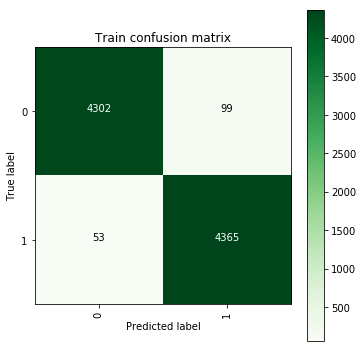

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

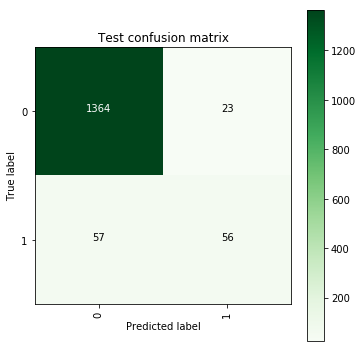

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
from sklearn.metrics import f1_score
accuracy = accuracy_score(y_te_1, y_pred)
roc_auc = auc(test_fpr, test_tpr)
f1 = f1_score(y_te_1, y_pred)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)
print("F1 Score for test data :",f1 )

Accuracy for test data : 0.9466666666666667
ROC for test data : 0.7985625051840414
F1 Score for test data : 0.5833333333333333


# Model based Imputation

## Loading Data

In [0]:
#Displaying all the rows and columns
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

#Loading data from csv file
data = pd.read_csv("./Data/telecom_churn_data.csv")
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [0]:
#Shape of data after loading
data.shape

(99999, 226)

In [0]:
#dropping the unique columns(Calculated at the beginning of this notebook) from the data
data = data.drop(columns = uniq_cols)

In [0]:
#Assigning the non date or numerical columns to a different dataframe data_num
date_cols = ['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_9',
             'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8','date_of_last_rech_data_9']
data_num = data.drop(date_cols, axis=1, inplace=False)

In [0]:
#Shape of data_num dataframe
data_num.shape

(99999, 202)

## Check for missing data

In [0]:
#checking for missing data in data_num dataframe
missing_data = data_num.isna()
missing_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,False,False,False,False,False,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,False,False,False,False,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,True,True,False,True,False,False,False,False,True,True,False,True,True,True,False,True,True,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fa

In [0]:
#Count of missing data for each column in the data_num dataframe
missing_data_count = missing_data.sum()
missing_data_count.sort_values()

mobile_number             0
last_day_rch_amt_9        0
last_day_rch_amt_8        0
last_day_rch_amt_7        0
last_day_rch_amt_6        0
max_rech_amt_9            0
max_rech_amt_8            0
max_rech_amt_7            0
max_rech_amt_6            0
total_rech_amt_9          0
total_rech_amt_8          0
total_rech_amt_7          0
total_rech_amt_6          0
total_rech_num_9          0
total_rech_num_8          0
total_rech_num_7          0
total_rech_num_6          0
total_ic_mou_9            0
total_ic_mou_8            0
total_ic_mou_7            0
total_ic_mou_6            0
jun_vbc_3g                0
total_og_mou_9            0
total_og_mou_8            0
vol_2g_mb_6               0
total_og_mou_7            0
vol_2g_mb_7               0
vol_2g_mb_9               0
jul_vbc_3g                0
aug_vbc_3g                0
aon                       0
sachet_3g_9               0
sachet_3g_8               0
sachet_3g_7               0
sachet_3g_6               0
monthly_3g_9        

## Data Imputation

In [0]:
#Extracting the data of columns which doesn't have null or NAN values.
df1 = data[(missing_data_count[missing_data_count == 0].index).tolist()]
print(df1.shape)

(99999, 58)


In [0]:
#Getting the column names of those which has NAN values
cols_with_na_vals = (missing_data_count[missing_data_count != 0].index).tolist()

In [0]:
#Model definition
import xgboost as xgb
clf = xgb.XGBRegressor()

In [0]:
#Model based imputation
for col in cols_with_na_vals:
    #Extracting the data from df1 for which the the column has NAN or null values. This will act as test data.
    X_test_df = df1[data_num[col].isna()]
    #Extracting the remaining data from df1 which has valid values for the column to be imputed. This will act as train data.
    X_train_df = df1[~df1.index.isin(X_test_df.index)]
    #Extracting the valid values of the column to be imputed. This will act as train labels.
    y_train_df = data_num[col][~data_num[col].isna()]
    
    #Training the model
    clf.fit(X_train_df,y_train_df)
    #Predicting the values to be imputed
    y_pred_df = clf.predict(X_test_df)
    
    #Replacing null/NAN values with the predicted values in the dataset
    data_num.loc[X_test_df.index, col] = y_pred_df

## Check for missing data after data imputation

In [0]:
#checking for missing data after data imputation
missing_data = data_num.isna()
missing_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [0]:
#Count of missing data for each column in the dataset after imputation
missing_data_count = missing_data.sum()
missing_data_count.sort_values()

mobile_number         0
total_rech_amt_9      0
max_rech_amt_6        0
max_rech_amt_7        0
max_rech_amt_8        0
max_rech_amt_9        0
last_day_rch_amt_6    0
last_day_rch_amt_7    0
last_day_rch_amt_8    0
last_day_rch_amt_9    0
total_rech_data_6     0
total_rech_data_7     0
total_rech_data_8     0
total_rech_data_9     0
max_rech_data_6       0
max_rech_data_7       0
max_rech_data_8       0
max_rech_data_9       0
count_rech_2g_6       0
count_rech_2g_7       0
count_rech_2g_8       0
count_rech_2g_9       0
total_rech_amt_8      0
count_rech_3g_6       0
total_rech_amt_7      0
total_rech_num_9      0
std_ic_mou_8          0
std_ic_mou_9          0
total_ic_mou_6        0
total_ic_mou_7        0
total_ic_mou_8        0
total_ic_mou_9        0
spl_ic_mou_6          0
spl_ic_mou_7          0
spl_ic_mou_8          0
spl_ic_mou_9          0
isd_ic_mou_6          0
isd_ic_mou_7          0
isd_ic_mou_8          0
isd_ic_mou_9          0
ic_others_6           0
ic_others_7     

After Data Imputation, We could see there are no null/NAN values in the dataset.

In [0]:
#Updating the dataframe 'data' with the predicted values
data[cols_with_na_vals] = data_num[cols_with_na_vals]

## Calculating Churn 

For telecom companies, majority of revenue comes from highly valued or top customers. So we will focus on highly values customers. If we reduce the churn of highly valued customers, the company's revenue loss ould be significantly reduced. So we are identifying the highly valued customers based on the recharge amount by having the 70th percentile as the cutoff limit.

In [0]:
#Calculating the total data recharge amount for each month
data['total_data_rech_amt_6'] = data['total_rech_data_6'] * data['av_rech_amt_data_6']
data['total_data_rech_amt_7'] = data['total_rech_data_7'] * data['av_rech_amt_data_7']

In [0]:
#Calculating the total amount for each month by adding the data recharge amount and the voice recharge amount
data['total_amt_6'] = data[['total_rech_amt_6','total_data_rech_amt_6']].sum(axis=1)
data['total_amt_7'] = data[['total_rech_amt_7','total_data_rech_amt_7']].sum(axis=1)

In [0]:
#Calculating the average amount for months 6 and 7
data['avg_amt_6_7'] = (data['total_amt_6'] + data['total_amt_7'])/2

In [0]:
#Calculating the 70th Percentile of the Average amount
print("The value of 70th Percentile :", data['avg_amt_6_7'].quantile(0.7))

The value of 70th Percentile : 496.71941462383757


The 70th Percentile is 497 and so we would consider the customers who have done a avarage recharge of more than or equal to 497 in the months of June and July as 'Highly Valued Customers'.

In [0]:
#Filtering highly valued customers with recharge amount greater than 70th Percentile amount
top_customers_data = data.loc[data['avg_amt_6_7'] >= 497, :]
top_customers_data.reset_index(drop = True, inplace = True)

In [0]:
#Shape of data after filtering top customers
top_customers_data.shape

(29986, 215)

In [0]:
#Dropping the columns created for the calculation of 70th Percentile
temp_columns = ['total_data_rech_amt_6','total_data_rech_amt_7','total_amt_6','total_amt_7','avg_amt_6_7']
top_customers_data = top_customers_data.drop(temp_columns , axis = 1)

In [0]:
#Shape of data after dropping derived columns
top_customers_data.shape

(29986, 210)

The customers who are highly likely to churn are the ones whose usage is drastically reduced or no usage at all. So we are marking the churn flag for customers who haven't used the services in the last month. September.

In [0]:
#Differentiating the churn and Non churn customers by marking the churn flag
top_customers_data['churn'] = np.where(((top_customers_data['total_ic_mou_9'] == 0.00) & 
                                        (top_customers_data['total_og_mou_9'] == 0.00) & 
                                        (top_customers_data['vol_2g_mb_9'] == 0.00) & 
                                        (top_customers_data['vol_3g_mb_9'] == 0.00)) , 1, 0)

## Checking for data imbalance 

After calculating the churn column, here we will look at how the data is balanced between churn and Non-churn.

In [0]:
#Calculating the percentage of churn and Non churn customers
top_customers_data['churn'].value_counts()/top_customers_data['churn'].shape[0]

0    0.917695
1    0.082305
Name: churn, dtype: float64

## Feature Engineering

We understand from the above plots that the usage of unhappy or churn customers has been reducing with time. We would take the data of June,July and August for training the models. Hence the difference in usage between the August month and the previous months would be really useful in predicting the churn.

In [0]:
#Creating new features which shows the difference between the 8th month data and the average of 6th and 7th months' data
top_customers_data['arpu_diff'] = top_customers_data['arpu_8'] - (top_customers_data[['arpu_6' , 'arpu_7']].mean(axis=1))
top_customers_data['onnet_mou_diff'] = top_customers_data['onnet_mou_8'] - (top_customers_data[['onnet_mou_6' , 'onnet_mou_7']].mean(axis=1))
top_customers_data['offnet_mou_diff'] = top_customers_data['offnet_mou_8'] - (top_customers_data[['offnet_mou_6' , 'offnet_mou_7']].mean(axis=1))
top_customers_data['roam_ic_mou_diff'] = top_customers_data['roam_ic_mou_8'] - (top_customers_data[['roam_ic_mou_6' , 'roam_ic_mou_7']].mean(axis=1))
top_customers_data['roam_og_mou_diff'] = top_customers_data['roam_og_mou_8'] - (top_customers_data[['roam_og_mou_6' , 'roam_og_mou_7']].mean(axis=1))
top_customers_data['loc_og_mou_diff'] = top_customers_data['loc_og_mou_8'] - (top_customers_data[['loc_og_mou_6' , 'loc_og_mou_7']].mean(axis=1))
top_customers_data['std_og_mou_diff'] = top_customers_data['std_og_mou_8'] - (top_customers_data[['std_og_mou_6' , 'std_og_mou_7']].mean(axis=1))
top_customers_data['isd_og_mou_diff'] = top_customers_data['isd_og_mou_8'] - (top_customers_data[['isd_og_mou_6' , 'isd_og_mou_7']].mean(axis=1))
top_customers_data['spl_og_mou_diff'] = top_customers_data['spl_og_mou_8'] - (top_customers_data[['spl_og_mou_6' , 'spl_og_mou_7']].mean(axis=1))
top_customers_data['total_og_mou_diff'] = top_customers_data['total_og_mou_8'] - (top_customers_data[['total_og_mou_6' , 'total_og_mou_7']].mean(axis=1))
top_customers_data['loc_ic_mou_diff'] = top_customers_data['loc_ic_mou_8'] - (top_customers_data[['loc_ic_mou_6' , 'loc_ic_mou_7']].mean(axis=1))
top_customers_data['std_ic_mou_diff'] = top_customers_data['std_ic_mou_8'] - (top_customers_data[['std_ic_mou_6' , 'std_ic_mou_7']].mean(axis=1))
top_customers_data['isd_ic_mou_diff'] = top_customers_data['isd_ic_mou_8'] - (top_customers_data[['isd_ic_mou_6' , 'isd_ic_mou_7']].mean(axis=1))
top_customers_data['spl_ic_mou_diff'] = top_customers_data['spl_ic_mou_8'] - (top_customers_data[['spl_ic_mou_6' , 'spl_ic_mou_7']].mean(axis=1))
top_customers_data['total_ic_mou_diff'] = top_customers_data['total_ic_mou_8'] - (top_customers_data[['total_ic_mou_6' , 'total_ic_mou_7']].mean(axis=1))
top_customers_data['total_rech_num_diff'] = top_customers_data['total_rech_num_8'] - (top_customers_data[['total_rech_num_6' , 'total_rech_num_7']].mean(axis=1))
top_customers_data['total_rech_amt_diff'] = top_customers_data['total_rech_amt_8'] - (top_customers_data[['total_rech_amt_6' , 'total_rech_amt_7']].mean(axis=1))
top_customers_data['max_rech_amt_diff'] = top_customers_data['max_rech_amt_8'] - (top_customers_data[['max_rech_amt_6' , 'max_rech_amt_7']].mean(axis=1))
top_customers_data['total_rech_data_diff'] = top_customers_data['total_rech_data_8'] - (top_customers_data[['total_rech_data_6' , 'total_rech_data_7']].mean(axis=1))
top_customers_data['max_rech_data_diff'] = top_customers_data['max_rech_data_8'] - (top_customers_data[['max_rech_data_6' , 'max_rech_data_7']].mean(axis=1))
top_customers_data['av_rech_amt_data_diff'] = top_customers_data['av_rech_amt_data_8'] - (top_customers_data[['av_rech_amt_data_6' , 'av_rech_amt_data_7']].mean(axis=1))
top_customers_data['vol_2g_mb_diff'] = top_customers_data['vol_2g_mb_8'] - (top_customers_data[['vol_2g_mb_6' , 'vol_2g_mb_7']].mean(axis=1))
top_customers_data['vol_3g_mb_diff'] = top_customers_data['vol_3g_mb_8'] - (top_customers_data[['vol_3g_mb_6' , 'vol_3g_mb_7']].mean(axis=1))

We can't use date fields as is. So we will extract the date from the date fields.

In [0]:
#Converting into datetime format
top_customers_data['date_of_last_rech_6'] = pd.to_datetime(top_customers_data['date_of_last_rech_6'])
top_customers_data['date_of_last_rech_7'] = pd.to_datetime(top_customers_data['date_of_last_rech_7'])
top_customers_data['date_of_last_rech_8'] = pd.to_datetime(top_customers_data['date_of_last_rech_8'])
top_customers_data['date_of_last_rech_data_6'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_6'])
top_customers_data['date_of_last_rech_data_7'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_7'])
top_customers_data['date_of_last_rech_data_8'] = pd.to_datetime(top_customers_data['date_of_last_rech_data_8'])

In [0]:
#Extracting the date from the date columns
top_customers_data['last_rech_date_6'] = top_customers_data['date_of_last_rech_6'].dt.day
top_customers_data['last_rech_date_7'] = top_customers_data['date_of_last_rech_7'].dt.day
top_customers_data['last_rech_date_8'] = top_customers_data['date_of_last_rech_8'].dt.day
top_customers_data['last_data_rech_date_6'] = top_customers_data['date_of_last_rech_data_6'].dt.day
top_customers_data['last_data_rech_date_7'] = top_customers_data['date_of_last_rech_data_7'].dt.day
top_customers_data['last_data_rech_date_8'] = top_customers_data['date_of_last_rech_data_8'].dt.day

As we derived the date information from the date type columns, we can remove them as we can't use object type columns for training.

In [0]:
#Dropping the date columns
top_customers_data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8',
         'date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8',], axis=1, inplace=True)

As we use the date of June,July and August months for training, we have to remove columns corresponding to September month to prevent Data leakage issue.

In [0]:
#Filtering the columns corresponding to 9th month
cols_9th_month = top_customers_data.filter(regex='_9|sep', axis = 1).columns
cols_9th_month

Index(['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9',
       'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9',
       'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9',
       'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9',
       'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9',
       'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9',
       'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
       'date_of_last_rech_9', 'last_day_rch_amt_9', 'date_of_last_rech_data_9',
       'total_rech_data_9', 'max_rech_data_9', 'count_rech_2g_9',
       'count_rech_3g_9', 'av_rech_amt_data_9', 'vol_2g_mb_9', 'vol_3g_mb_9',
       'arpu_3g_9', 'arpu_2g_9', 'night_pck_user_9', 'monthly_2g_9',
       'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9

In [0]:
#Dropping the 9th month columns to avoid data leakage issue
top_customers_data = top_customers_data.drop(cols_9th_month, axis=1)

## Check for missing data in feature Engineered columns

In [0]:
#checking for missing data
missing_data = top_customers_data.isna()
missing_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,last_rech_date_6,last_rech_date_7,last_rech_date_8,last_data_rech_date_6,last_data_rech_date_7,last_data_rech_date_8
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [0]:
#Count of missing data for each column in the dataset
missing_data_count = missing_data.sum()
missing_data_count.sort_values()

mobile_number                0
count_rech_3g_7              0
count_rech_3g_8              0
av_rech_amt_data_6           0
av_rech_amt_data_7           0
av_rech_amt_data_8           0
vol_2g_mb_6                  0
vol_2g_mb_7                  0
vol_2g_mb_8                  0
count_rech_3g_6              0
vol_3g_mb_6                  0
vol_3g_mb_8                  0
arpu_3g_6                    0
arpu_3g_7                    0
arpu_3g_8                    0
arpu_2g_6                    0
arpu_2g_7                    0
arpu_2g_8                    0
night_pck_user_6             0
vol_3g_mb_7                  0
night_pck_user_7             0
count_rech_2g_8              0
count_rech_2g_6              0
total_rech_num_6             0
total_rech_num_7             0
total_rech_num_8             0
total_rech_amt_6             0
total_rech_amt_7             0
total_rech_amt_8             0
max_rech_amt_6               0
max_rech_amt_7               0
count_rech_2g_7              0
max_rech

## Data Imputation for feature Engineered columns

In [0]:
#Extracting the data of columns which doesn't have null or NAN values.
df1 = top_customers_data[(missing_data_count[missing_data_count == 0].index).tolist()]
print(df1.shape)

(29986, 176)


In [0]:
#Getting the date column names of those which has NAN values
date_cols_with_na_vals = (missing_data_count[missing_data_count != 0].index).tolist()

In [0]:
#Model Definition
import xgboost as xgb
clf = xgb.XGBRegressor()

In [0]:
#Model based imputation
for col in date_cols_with_na_vals:
    #Extracting the data from df1 for which the the column has NAN or null values. This will act as test data.
    X_test_df = df1[top_customers_data[col].isna()]
    #Extracting the remaining data from df1 which has valid values for the column to be imputed. This will act as train data.
    X_train_df = df1[~df1.index.isin(X_test_df.index)]
    #Extracting the valid values of the column to be imputed. This will act as train labels.
    y_train_df = top_customers_data[col][~top_customers_data[col].isna()]
    
    #Training the model
    clf.fit(X_train_df,y_train_df)
    #Predicting the values to be imputed
    y_pred_df = clf.predict(X_test_df)
    
    #Replacing null/NAN values with the predicted values in the dataset
    top_customers_data.loc[X_test_df.index, col] = y_pred_df

## Checking for missing data after Data Imputation

In [0]:
#checking for missing data
missing_data = top_customers_data.isna()
missing_data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,total_og_mou_diff,loc_ic_mou_diff,std_ic_mou_diff,isd_ic_mou_diff,spl_ic_mou_diff,total_ic_mou_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,last_rech_date_6,last_rech_date_7,last_rech_date_8,last_data_rech_date_6,last_data_rech_date_7,last_data_rech_date_8
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Fal

In [0]:
#Count of missing data for each column in the dataset
missing_data_count = missing_data.sum()
missing_data_count.sort_values()

mobile_number            0
av_rech_amt_data_7       0
av_rech_amt_data_8       0
vol_2g_mb_6              0
vol_2g_mb_7              0
vol_2g_mb_8              0
vol_3g_mb_6              0
vol_3g_mb_7              0
vol_3g_mb_8              0
av_rech_amt_data_6       0
arpu_3g_6                0
arpu_3g_8                0
arpu_2g_6                0
arpu_2g_7                0
arpu_2g_8                0
night_pck_user_6         0
night_pck_user_7         0
night_pck_user_8         0
monthly_2g_6             0
arpu_3g_7                0
count_rech_3g_8          0
count_rech_3g_7          0
count_rech_3g_6          0
total_rech_num_8         0
total_rech_amt_6         0
total_rech_amt_7         0
total_rech_amt_8         0
max_rech_amt_6           0
max_rech_amt_7           0
max_rech_amt_8           0
last_day_rch_amt_6       0
last_day_rch_amt_7       0
last_day_rch_amt_8       0
total_rech_data_6        0
total_rech_data_7        0
total_rech_data_8        0
max_rech_data_6          0
m

After data imputation, we could see that there are no null/NAN values for any column.

As discussed in the previous section, Mobile number is unique across customers and is of no use. Hence dropping the column.

In [0]:
#Dropping the mobile number column
top_customers_data.drop(['mobile_number'], axis=1, inplace=True)
data_final = top_customers_data

In [8]:
#Shape of data after Preprocessing and Feature Engineering
data_final.shape

(29986, 181)

# Models

In [0]:
#Segregating the label column from other columns
y = data_final['churn'].values
X = data_final.drop(['churn'], axis=1)

In [10]:
#train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(23988, 180) (23988,)
(5998, 180) (5998,)


In [11]:
#Random upsampling using SMOTE
#Source : https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/

from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=2)
X_train, y_train = smote.fit_sample(X_train, y_train.ravel())

print(X_train.shape, y_train.shape)

print("Count of label 0 :",sum(y_train == 0))
print("Count of label 1 :",sum(y_train == 1))

(44028, 180) (44028,)
Count of label 0 : 22014
Count of label 1 : 22014


## Logistic Regression

### Hyper-Parameter Tuning

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [02:12<00:00, 13.27s/it]


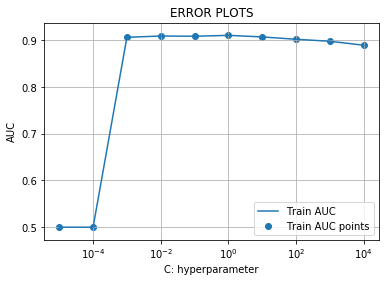

In [0]:
#Hyper-parameter tuning
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

train_auc = []

C = [0.00001,0.0001,0.001,0.01,0.1,1,10,100,1000,10000]
for i in tqdm(C):    
    LR = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf = LR.fit(X_train, y_train)
    calibrator = CalibratedClassifierCV(clf, method="sigmoid")
    model=calibrator.fit(X_train, y_train)

    y_train_pred = batch_predict(model, X_train)    

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))

plt.plot(C, train_auc, label='Train AUC')

plt.scatter(C, train_auc, label='Train AUC points')

plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.xscale("log")
plt.show()

## Testing the performance of the model on test data, plotting ROC Curves

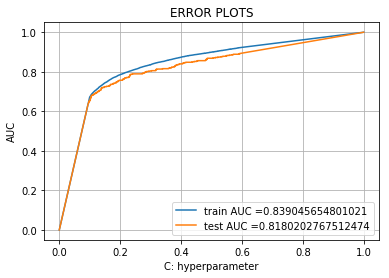

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_alpha = 0.01

LR = SGDClassifier(alpha=best_alpha, penalty='l2', loss='log', random_state=42)
clf = LR.fit(X_train, y_train)
calibrator = CalibratedClassifierCV(clf, method="sigmoid")
model=calibrator.fit(X_train, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(LR, X_train)    
y_test_pred = batch_predict(LR, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.6337787645875541 for threshold 0.0


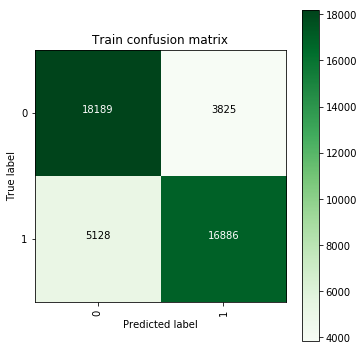

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

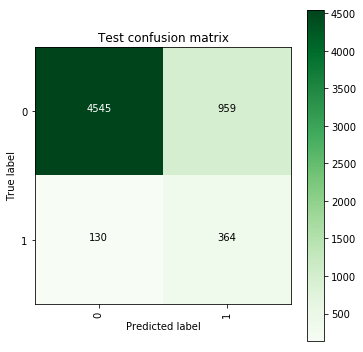

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.8184394798266089
ROC for test data : 0.8180202767512474


## Random Forest

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[2, 3, 4, 5, 6, 8, 10],
              'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]} 

RF = RandomForestClassifier(class_weight='balanced')
gsv = GridSearchCV(estimator = RF, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:   47.0s
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-2)]: Done  44 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-2)]: Done  55 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-2)]: Done  66 tasks      | elapsed:  9.8min
[Parallel(n_jobs=-2)]: Done  79 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-2)]: Done  92 tasks      | elapsed: 17.7min
[Parallel(n_jobs=-2)]: Done 107 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-2)]: Done 122 tasks      | elapsed: 28.5min
[Parallel(n_jobs=-2)]: Done 139 tasks      | elapsed: 33.9min
[Parallel(n_jobs=-2)]: Done 156 tasks      | elapsed: 39

best values after hyperparameter tuning :  {'max_depth': 10, 'n_estimators': 100}


## Testing the performance of the model on test data, plotting ROC Curves

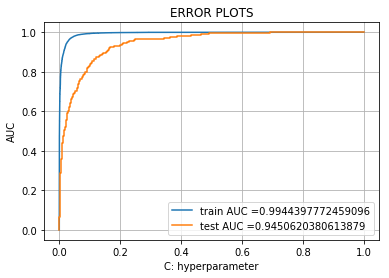

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_n_estimators = 100
best_max_depth = 10

RF = RandomForestClassifier(class_weight='balanced', n_estimators=best_n_estimators, max_depth=best_max_depth)
RF.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(RF, X_train)    
y_test_pred = batch_predict(RF, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9338458675863157 for threshold 0.504


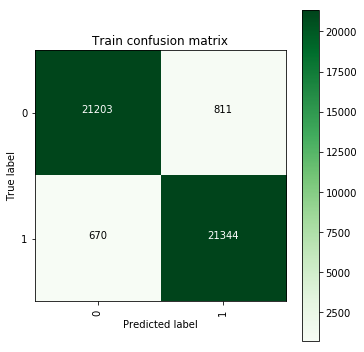

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

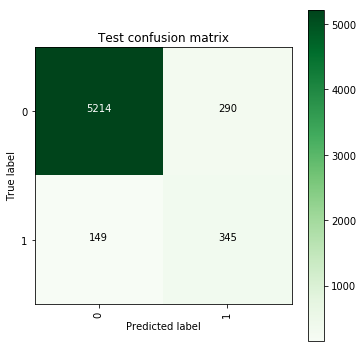

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.926808936312104
ROC for test data : 0.9450620380613879


## XGBoost

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[2, 3, 4, 5, 6, 8, 10],
              'n_estimators':[10, 50, 100, 150, 200, 300, 500, 1000]} 

XGB = xgb.XGBClassifier()
gsv = GridSearchCV(estimator = XGB, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 56 candidates, totalling 168 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed: 11.2min
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed: 19.5min
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed: 23.3min
[Parallel(n_jobs=-2)]: Done  44 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-2)]: Done  55 tasks      | elapsed: 49.4min
[Parallel(n_jobs=-2)]: Done  66 tasks      | elapsed: 59.8min
[Parallel(n_jobs=-2)]: Done  79 tasks      | elapsed: 82.5min
[Parallel(n_jobs=-2)]: Done  92 tasks      | elapsed: 103.1min
[Parallel(n_jobs=-2)]: Done 107 tasks      | elapsed: 122.4min
[Parallel(n_jobs=-2)]: Done 122 tasks      | elapsed: 149.4min
[Parallel(n_jobs=-2)]: Done 139 tasks      | elapsed: 176.1min
[Parallel(n_jobs=-2)]: Done 156 tasks      | elapsed

best values after hyperparameter tuning :  {'max_depth': 10, 'n_estimators': 50}


## Testing the performance of the model on test data, plotting ROC Curves

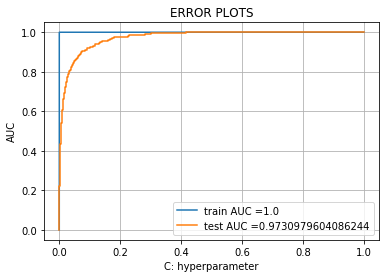

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_n_estimators = 50
best_max_depth = 10

XGB = xgb.XGBClassifier(n_estimators=best_n_estimators, max_depth=best_max_depth)
XGB.fit(X_train, y_train)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(XGB, X_train)    
y_test_pred = batch_predict(XGB, X_test)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 1.0 for threshold 0.837


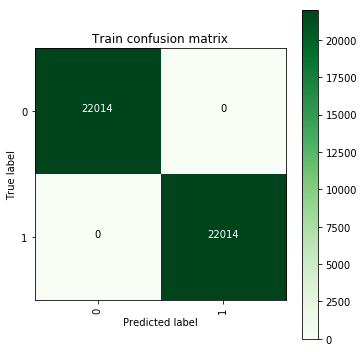

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

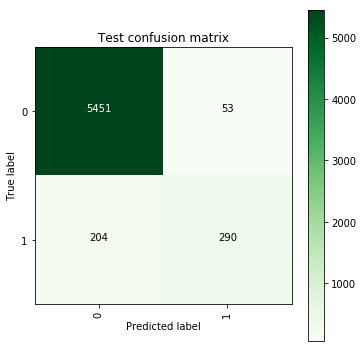

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.9571523841280427
ROC for test data : 0.9730979604086244


## Decision Trees

### Feature Selection using Recursive Feature Elimination

In [0]:
from sklearn.feature_selection import RFECV

rfc = DecisionTreeClassifier(random_state=105)
rfecv = RFECV(estimator=rfc, step=10, cv=3, scoring='accuracy')
rfecv.fit(X_train, y_train)

RFECV(cv=3,
      estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                       criterion='gini', max_depth=None,
                                       max_features=None, max_leaf_nodes=None,
                                       min_impurity_decrease=0.0,
                                       min_impurity_split=None,
                                       min_samples_leaf=1, min_samples_split=2,
                                       min_weight_fraction_leaf=0.0,
                                       presort='deprecated', random_state=105,
                                       splitter='best'),
      min_features_to_select=1, n_jobs=None, scoring='accuracy', step=10,
      verbose=0)

In [0]:
#Printing number of optimal features
print('Optimal number of features: {}'.format(rfecv.n_features_))

Optimal number of features: 40


In [0]:
#Retaining the columns given by RFECV and dropping the remaining ones
X_train_dt = X_train.drop(X_train.columns[np.where(rfecv.support_ == False)[0]], axis=1)
X_test_dt = X_test.drop(X_test.columns[np.where(rfecv.support_ == False)[0]], axis=1)

### Hyper-Parameter Tuning

In [0]:
#Hyper-parameter tuning

parameters = {'max_depth':[1,5,10,50],
              'min_samples_split':[5,10,100,500]} 

DT = DecisionTreeClassifier()
gsv = GridSearchCV(estimator = DT, param_grid=parameters, cv=3, verbose=10, n_jobs=-2)
gsv.fit(X_train_dt, y_train)

print('best values after hyperparameter tuning : ',gsv.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-2)]: Using backend LokyBackend with 3 concurrent workers.
[Parallel(n_jobs=-2)]: Done   2 tasks      | elapsed:    8.9s
[Parallel(n_jobs=-2)]: Done   7 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-2)]: Done  12 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-2)]: Done  19 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-2)]: Done  26 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-2)]: Done  35 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:   29.7s remaining:    0.0s
[Parallel(n_jobs=-2)]: Done  48 out of  48 | elapsed:   29.7s finished


best values after hyperparameter tuning :  {'max_depth': 10, 'min_samples_split': 5}


## Testing the performance of the model on test data, plotting ROC Curves

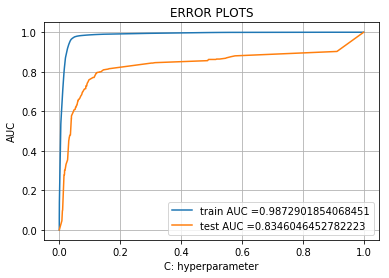

In [0]:
#Testing the model on the test data
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve
from sklearn.metrics import roc_curve, auc

best_max_depth = 10
best_min_samples_split = 5

DT = DecisionTreeClassifier(max_depth=best_max_depth, min_samples_split=best_min_samples_split)
DT.fit(X_train_dt, y_train)

# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = batch_predict(DT, X_train_dt)    
y_test_pred = batch_predict(DT, X_test_dt)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_train, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_test, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9277546638164771 for threshold 0.511


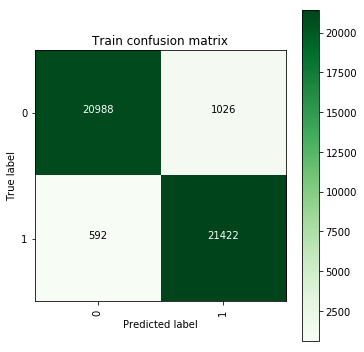

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

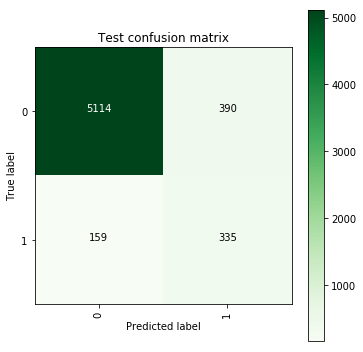

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
accuracy = accuracy_score(y_test, predict_with_best_t(y_test_pred, best_t))
roc_auc = auc(test_fpr, test_tpr)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)

Accuracy for test data : 0.9084694898299434
ROC for test data : 0.8346046452782223


## Stacking Model

Here we are using X_train to train the metaclassifier and X_test to test the metaclassifier. X_train is further divided into T1 and T2. T1 is used to train the base models and T2 is used to compute predictions using which we will train the metaclassifier. Similarly X_test is further divided into T3 and T4. T3 is used to train the base models and T4 is used to compute predictions using which we will test the accuracy of metaclassifier. 

### Generating Row Samples with Replacement

In [0]:
#Converting labels into a dataframe in order to concatenate with X_train
Y_train_df = pd.DataFrame(data=y_train, columns = ['churn'])

print(X_train.shape)
print(Y_train_df.shape)

(44028, 180)
(44028, 1)


In [0]:
#Concatenating X_train with y_train(labels)
Train_data = pd.concat([X_train,Y_train_df], axis=1)

print(Train_data.shape)

(44028, 181)


In [0]:
#Splitting the train dataset into 2 parts,one for training the base models and another for computing predictions from the models.
T1 = Train_data.sample(frac=0.8, random_state=200)
T2 = Train_data.drop(T1.index)

print(T1.shape)
print(T2.shape)

(35222, 181)
(8806, 181)


In [0]:
#Generating 10 random samples from T1 dataset of size 20k with replacement
S1 = T1.sample(n = 20000, replace = True, axis = 0) 
S2 = T1.sample(n = 20000, replace = True, axis = 0) 
S3 = T1.sample(n = 20000, replace = True, axis = 0) 
S4 = T1.sample(n = 20000, replace = True, axis = 0) 
S5 = T1.sample(n = 20000, replace = True, axis = 0) 
S6 = T1.sample(n = 20000, replace = True, axis = 0) 
S7 = T1.sample(n = 20000, replace = True, axis = 0) 
S8 = T1.sample(n = 20000, replace = True, axis = 0) 
S9 = T1.sample(n = 20000, replace = True, axis = 0) 
S10 = T1.sample(n = 20000, replace = True, axis = 0)
S11 = T1.sample(n = 20000, replace = True, axis = 0) 
S12 = T1.sample(n = 20000, replace = True, axis = 0) 
S13 = T1.sample(n = 20000, replace = True, axis = 0) 
S14 = T1.sample(n = 20000, replace = True, axis = 0) 
S15 = T1.sample(n = 20000, replace = True, axis = 0)

In [0]:
#Defining the classifiers or models
clf1 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf2 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf3 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf4 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf5 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf6 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf7 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf8 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf9 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf10 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf11 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf12 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf13 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf14 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf15 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
meta_clf = xgb.XGBClassifier(n_estimators=50, max_depth=10)

In [0]:
#Segregating the label column from other columns for each sample
y1 = S1['churn'].values
X1 = S1.drop(['churn'], axis=1)

y2 = S2['churn'].values
X2 = S2.drop(['churn'], axis=1)

y3 = S3['churn'].values
X3 = S3.drop(['churn'], axis=1)

y4 = S4['churn'].values
X4 = S4.drop(['churn'], axis=1)

y5 = S5['churn'].values
X5 = S5.drop(['churn'], axis=1)

y6 = S6['churn'].values
X6 = S6.drop(['churn'], axis=1)

y7 = S7['churn'].values
X7 = S7.drop(['churn'], axis=1)

y8 = S8['churn'].values
X8 = S8.drop(['churn'], axis=1)

y9 = S9['churn'].values
X9 = S9.drop(['churn'], axis=1)

y10 = S10['churn'].values
X10 = S10.drop(['churn'], axis=1)

y11 = S11['churn'].values
X11 = S11.drop(['churn'], axis=1)

y12 = S12['churn'].values
X12 = S12.drop(['churn'], axis=1)

y13 = S13['churn'].values
X13 = S13.drop(['churn'], axis=1)

y14 = S14['churn'].values
X14 = S14.drop(['churn'], axis=1)

y15 = S15['churn'].values
X15 = S15.drop(['churn'], axis=1)

### Training and computing Predictions using base models

In [0]:
#Training each model with different sample
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
X = [X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15]
y = [y1,y2,y3,y4,y5,y6,y7,y8,y9,y10,y11,y12,y13,y14,y15]

for i in range(0,15):
    classifier = classifiers[i]
    classifier.fit(X[i], y[i])
    classifiers[i] = classifier

In [0]:
#Segregating the label column from other columns for T2 dataset
y_te = T2['churn'].values
X_te = T2.drop(['churn'], axis=1)

In [0]:
#Computing predictions using T2 dataset
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
dict = {}

for i in range(0,15):
    classifier = classifiers[i]
    dict["y_pred_{0}".format(i)] = classifier.predict(X_te)

In [0]:
#Building a dataframe with the predictions
pred_df = pd.DataFrame(data=np.hstack((dict['y_pred_0'][:,None], 
                                           dict['y_pred_1'][:,None],
                                           dict['y_pred_2'][:,None],                                         
                                           dict['y_pred_3'][:,None],
                                           dict['y_pred_4'][:,None],
                                           dict['y_pred_5'][:,None],
                                           dict['y_pred_6'][:,None],
                                           dict['y_pred_7'][:,None],
                                           dict['y_pred_8'][:,None],
                                           dict['y_pred_9'][:,None],
                                           dict['y_pred_10'][:,None],
                                           dict['y_pred_11'][:,None],
                                           dict['y_pred_12'][:,None],                                         
                                           dict['y_pred_13'][:,None],
                                           dict['y_pred_14'][:,None])), 
                           columns = ['P1', 'P2', 'P3','P4', 'P5', 'P6','P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13','P14', 'P15'])

### Training Meta Classifier

In [0]:
#Training the metaclassifier
meta_clf.fit(pred_df,y_te)

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.300000012, max_delta_step=0, max_depth=10,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=50, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

### Testing Meta Classifier

In [0]:
#Converting labels into a dataframe in order to concatenate with X_test
Y_test_df = pd.DataFrame(data=y_test, columns = ['churn'])

print(X_test.shape)
print(Y_test_df.shape)

(5998, 180)
(5998, 1)


In [0]:
#Resetting the index of the dataset
X_test.reset_index(drop=True, inplace=True)
Y_test_df.reset_index(drop=True, inplace=True)

In [0]:
#Concatenating X_test with y_test(labels)
Test_data = pd.concat([X_test,Y_test_df], axis=1)

print(Test_data.shape)

(5998, 181)


In [0]:
#Splitting the train dataset into 2 parts,one for training the base models and another for computing predictions from the models.
T3 = Test_data.sample(frac=0.75, random_state=250)
T4 = Test_data.drop(T3.index)

print(T3.shape)
print(T4.shape)

(4498, 181)
(1500, 181)


In [0]:
#Generating 10 random samples from T3 dataset of size 20k with replacement
 
S16 = T3.sample(n = 20000, replace = True, axis = 0) 
S17 = T3.sample(n = 20000, replace = True, axis = 0) 
S18 = T3.sample(n = 20000, replace = True, axis = 0) 
S19 = T3.sample(n = 20000, replace = True, axis = 0) 
S20 = T3.sample(n = 20000, replace = True, axis = 0)
S21 = T3.sample(n = 20000, replace = True, axis = 0) 
S22 = T3.sample(n = 20000, replace = True, axis = 0) 
S23 = T3.sample(n = 20000, replace = True, axis = 0) 
S24 = T3.sample(n = 20000, replace = True, axis = 0) 
S25 = T3.sample(n = 20000, replace = True, axis = 0) 
S26 = T3.sample(n = 20000, replace = True, axis = 0) 
S27 = T3.sample(n = 20000, replace = True, axis = 0) 
S28 = T3.sample(n = 20000, replace = True, axis = 0) 
S29 = T3.sample(n = 20000, replace = True, axis = 0) 
S30 = T3.sample(n = 20000, replace = True, axis = 0) 

In [0]:
#Defining the classifiers or models

clf1 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf2 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf3 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf4 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf5 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf6 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf7 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf8 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf9 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf10 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf11 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf12 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf13 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf14 = xgb.XGBClassifier(n_estimators=50, max_depth=10)
clf15 = xgb.XGBClassifier(n_estimators=50, max_depth=10)

In [0]:
#Segregating the label column from other columns for each sample

y16 = S16['churn'].values
X16 = S16.drop(['churn'], axis=1)

y17 = S17['churn'].values
X17 = S17.drop(['churn'], axis=1)

y18 = S18['churn'].values
X18 = S18.drop(['churn'], axis=1)

y19 = S19['churn'].values
X19 = S19.drop(['churn'], axis=1)

y20 = S20['churn'].values
X20 = S20.drop(['churn'], axis=1)

y21 = S21['churn'].values
X21 = S21.drop(['churn'], axis=1)

y22 = S22['churn'].values
X22 = S22.drop(['churn'], axis=1)

y23 = S23['churn'].values
X23 = S23.drop(['churn'], axis=1)

y24 = S24['churn'].values
X24 = S24.drop(['churn'], axis=1)

y25 = S25['churn'].values
X25 = S25.drop(['churn'], axis=1)

y26 = S26['churn'].values
X26 = S26.drop(['churn'], axis=1)

y27 = S27['churn'].values
X27 = S27.drop(['churn'], axis=1)

y28 = S28['churn'].values
X28 = S28.drop(['churn'], axis=1)

y29 = S29['churn'].values
X29 = S29.drop(['churn'], axis=1)

y30 = S30['churn'].values
X30 = S30.drop(['churn'], axis=1)

In [0]:
#Training each model with different sample
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
X = [X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30]
y = [y16,y17,y18,y19,y20,y21,y22,y23,y24,y25,y26,y27,y28,y29,y30]

for i in range(0,15):
    classifier = classifiers[i]
    classifier.fit(X[i], y[i])
    classifiers[i] = classifier

In [0]:
#Segregating the label column from other columns for T4 dataset
y_te_1 = T4['churn'].values
X_te_1 = T4.drop(['churn'], axis=1)

In [0]:
#Computing predictions using T4 dataset
classifiers = [clf1,clf2,clf3,clf4,clf5,clf6,clf7,clf8,clf9,clf10,clf11,clf12,clf13,clf14,clf15]
dict_1 = {}

for i in range(0,15):
    classifier = classifiers[i]
    dict_1["y_pred_{0}".format(i)] = classifier.predict(X_te_1)

In [0]:
#Building a dataframe with the predictions

pred_df_1 = pd.DataFrame(data=np.hstack((dict_1['y_pred_0'][:,None], 
                                           dict_1['y_pred_1'][:,None],
                                           dict_1['y_pred_2'][:,None],                                         
                                           dict_1['y_pred_3'][:,None],
                                           dict_1['y_pred_4'][:,None],
                                           dict_1['y_pred_5'][:,None],
                                           dict_1['y_pred_6'][:,None],
                                           dict_1['y_pred_7'][:,None],
                                           dict_1['y_pred_8'][:,None],
                                           dict_1['y_pred_9'][:,None],
                                           dict_1['y_pred_10'][:,None],
                                           dict_1['y_pred_11'][:,None],
                                           dict_1['y_pred_12'][:,None],                                         
                                           dict_1['y_pred_13'][:,None],
                                           dict_1['y_pred_14'][:,None])), 
                           columns = ['P1', 'P2', 'P3','P4', 'P5', 'P6','P7', 'P8', 'P9', 'P10', 'P11', 'P12', 'P13','P14', 'P15'])

In [0]:
#Computing Predictions from MetaClassifier
y_pred = meta_clf.predict(pred_df_1)

In [0]:
#computing confusion matrix for train and test data and threshold that will give least fpr
from sklearn.metrics import confusion_matrix

y_train_pred = batch_predict(meta_clf, pred_df)    
y_test_pred = batch_predict(meta_clf, pred_df_1)

train_fpr, train_tpr, tr_thresholds = roc_curve(y_te, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_te_1, y_test_pred)

best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
cm_train = confusion_matrix(y_te, predict_with_best_t(y_train_pred, best_t))
cm_test = confusion_matrix(y_te_1, predict_with_best_t(y_test_pred, best_t))

the maximum value of tpr*(1-fpr) 0.9762107018954894 for threshold 0.515


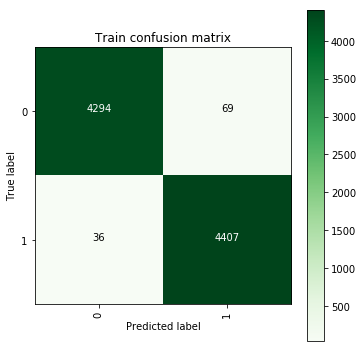

In [0]:
#Plotting the confusion matrix for train data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_train, classes=[0,1], title='Train confusion matrix', cmap = plt.cm.Greens)
plt.show()

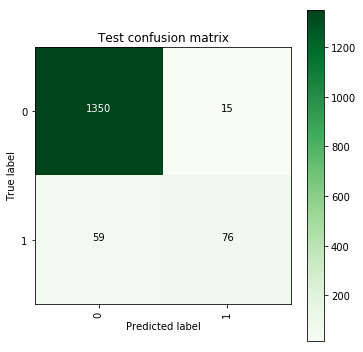

In [0]:
#Plotting the confusion matrix for test data
plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(cm_test, classes=[0,1], title='Test confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [0]:
#calculating Accuracy and AUC score
from sklearn.metrics import f1_score
accuracy = accuracy_score(y_te_1, y_pred)
roc_auc = auc(test_fpr, test_tpr)
f1 = f1_score(y_te_1, y_pred)

print("Accuracy for test data :",accuracy )
print("ROC for test data :",roc_auc)
print("F1 Score for test data :",f1 )

Accuracy for test data : 0.9506666666666667
ROC for test data : 0.8775172975172976
F1 Score for test data : 0.6754385964912281


## MLP Model

In [12]:
# Importing libraries
from keras.utils import np_utils 
from keras.datasets import mnist 
import seaborn as sns
from keras.initializers import RandomNormal
from keras.models import Sequential 
from keras.layers import Dense, Activation

Using TensorFlow backend.


In [0]:
#Function to plot loss vs epoch plot
# https://gist.github.com/greydanus/f6eee59eaf1d90fcb3b534a25362cea4
# https://stackoverflow.com/a/14434334
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import time

def plt_dynamic(x, vy, ty, ax, colors=['b']):
    
    """This function is used to plot Loss Vs Epoch Plot."""
    
    ax.plot(x, vy, 'b', label="Validation Loss")
    ax.plot(x, ty, 'r', label="Train Loss")
    plt.legend()
    plt.grid()
    fig.canvas.draw()

In [14]:
# Here we are having a class number for each row
# Lets convert this into a 2 dimensional vector which is needed for MLPs
print("Class label of first image :", y_train[0])

Y_train = np_utils.to_categorical(y_train, 2) 
Y_test = np_utils.to_categorical(y_test, 2)

print("After converting the output into a vector : ",Y_train[0])

Class label of first image : 0
After converting the output into a vector :  [1. 0.]


In [0]:
#Initializing few model parameters

output_dim = 2
input_dim = X_train.shape[1]

batch_size = 128 
nb_epoch = 200

In [16]:
#Building the Model
from keras.layers import Dropout

model_drop = Sequential()

model_drop.add(Dense(512, activation='relu', input_shape=(input_dim,)))

model_drop.add(Dense(384, activation='relu') )

model_drop.add(Dense(256, activation='relu') )

model_drop.add(Dense(128, activation='relu') )
model_drop.add(Dropout(0.25))

model_drop.add(Dense(64, activation='relu') )

model_drop.add(Dense(48, activation='relu') )

model_drop.add(Dense(32, activation='relu') )
model_drop.add(Dropout(0.25))

model_drop.add(Dense(output_dim, activation='softmax'))

model_drop.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 512)               92672     
_________________________________________________________________
dense_2 (Dense)              (None, 384)               196992    
_________________________________________________________________
dense_3 (Dense)              (None, 256)               98560     
_________________________________________________________________
dense_4 (Dense)              (None, 128)               32896     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_6 (Dense)              (None, 48)               

In [0]:
#Defining Model Checkpointing and Early Stopping
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint1 = ModelCheckpoint("model_1.h5",
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only = True,
                             verbose=1)
earlystop1 = EarlyStopping(monitor = 'val_accuracy', 
                            mode="max",
                            min_delta = 0, 
                            patience = 5,
                            verbose = 1)

callbacks_1 = [checkpoint1,earlystop1]

In [21]:
#Compiling and training the model
model_drop.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

history = model_drop.fit(X_train, Y_train, batch_size=batch_size, epochs=nb_epoch, verbose=1, callbacks=callbacks_1, validation_data=(X_test, Y_test))

Train on 44028 samples, validate on 5998 samples
Epoch 1/200
44028/44028 [==============================] - 2s 53us/step - loss: 0.1079 - accuracy: 0.9680 - val_loss: 0.7348 - val_accuracy: 0.8991

Epoch 00001: val_accuracy did not improve from 0.92364
Epoch 2/200
44028/44028 [==============================] - 2s 47us/step - loss: 0.0836 - accuracy: 0.9735 - val_loss: 0.9473 - val_accuracy: 0.9033

Epoch 00002: val_accuracy did not improve from 0.92364
Epoch 3/200
44028/44028 [==============================] - 2s 51us/step - loss: 0.0765 - accuracy: 0.9763 - val_loss: 0.7619 - val_accuracy: 0.9025

Epoch 00003: val_accuracy did not improve from 0.92364
Epoch 4/200
44028/44028 [==============================] - 2s 48us/step - loss: 0.0677 - accuracy: 0.9777 - val_loss: 1.2591 - val_accuracy: 0.9265

Epoch 00004: val_accuracy improved from 0.92364 to 0.92648, saving model to model_1.h5
Epoch 5/200
44028/44028 [==============================] - 2s 51us/step - loss: 0.0668 - accuracy: 0.97

Test score: 1.1046655414083013
Test accuracy: 0.918806254863739


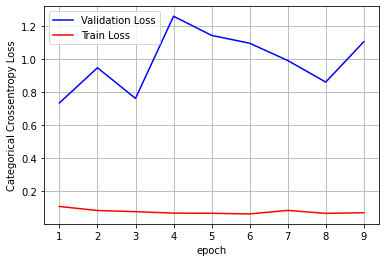

In [23]:
#Plotting the loss vs epoch plot
%matplotlib inline
import math
score = model_drop.evaluate(X_test, Y_test, verbose=0) 
print('Test score:', score[0]) 
print('Test accuracy:', score[1])

fig,ax = plt.subplots(1,1)
ax.set_xlabel('epoch') ; ax.set_ylabel('Categorical Crossentropy Loss')

# list of epoch numbers
x = list(range(1,10))

vy = history.history['val_loss']
ty = history.history['loss']
plt_dynamic(x, vy, ty, ax)

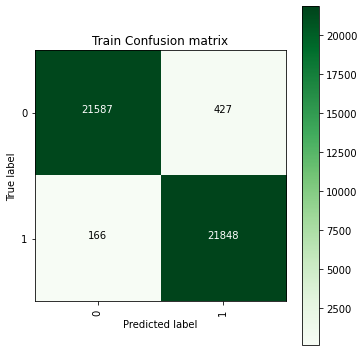

In [24]:
#Plotting Train Confusion Matrix
predictions = model_drop.predict(X_train)
y_train_pred = (predictions > 0.5)

train_matrix = metrics.confusion_matrix(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(train_matrix, classes=[0,1], title='Train Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [31]:
#Computing Precision and Recall for Train dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)

print("Train Precision Score for Class 0 :",precision)
print("Train Recall Score for Class 0 :",recall)

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)

print("\nTrain Precision Score for Class 1 :",precision)
print("Train Recall Score for Class 1 :",recall)

Train Precision Score for Class 0: 0.9923688686617937
Train Recall Score for Class 0: 0.9806032524756972

Train Precision Score for Class 1: 0.9808305274971941
Train Recall Score for Class 1: 0.992459344053784


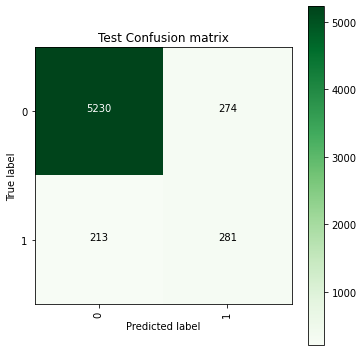

In [26]:
#Plotting Test Confusion Matrix
predictions = model_drop.predict(X_test)
y_test_pred = (predictions > 0.5)

test_matrix = metrics.confusion_matrix(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(test_matrix, classes=[0,1], title='Test Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [33]:
#Computing Precision and Recall for Test dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)

print("Test Precision Score for Class 0 :",precision)
print("Test Recall Score for Class 0 :",recall)

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)

print("\nTest Precision Score for Class 1 :",precision)
print("Test Recall Score for Class 1 :",recall)

Test Precision Score for Class 0 : 0.9608671688407129
Test Recall Score for Class 0 : 0.950218023255814

Test Precision Score for Class 1 : 0.5063063063063064
Test Recall Score for Class 1 : 0.5688259109311741


## CNN

In [0]:
#Importing required libraries
from __future__ import print_function
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, BatchNormalization
from keras.layers import Conv2D, Conv1D, MaxPooling2D, MaxPooling1D
from keras import backend as K

In [0]:
#Initializing few model parameters
batch_size = 128
num_classes = 2
epochs = 200

In [0]:
#Reshaping the data to make it compatible with CNN Model
X_test = X_test.values

X_train_cnn = X_train.reshape(X_train.shape[0], 180, 1)
X_test_cnn = X_test.reshape(X_test.shape[0], 180, 1)
input_shape = (180,1)

In [0]:
#Building the Model
model = Sequential()

#convolution 1st layer
model.add(Conv1D(64, kernel_size=(5), padding='same', activation='relu', strides=(2), input_shape=input_shape))
model.add(MaxPooling1D(pool_size=(2)))

#convolution 2nd layer
model.add(Conv1D(64, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#convolution 3rd layer
model.add(Conv1D(64, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#convolution 4th layer
model.add(Conv1D(96, kernel_size=(5), padding='same', strides=(2), activation='relu'))
model.add(MaxPooling1D(pool_size=(2)))
model.add(Dropout(0.3))

#convolution 5th layer
model.add(Conv1D(96, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#convolution 6th layer
model.add(Conv1D(96, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#convolution 7th layer
model.add(Conv1D(128, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#Fully connected 1st layer
model.add(Flatten()) 
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

#Fully connected final layer
model.add(Dense(num_classes, activation='softmax'))

#Compiling the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [0]:
#Defining Model Checkpointing and Early Stopping
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint2 = ModelCheckpoint("model_2.h5",
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only = True,
                             verbose=1)
earlystop2 = EarlyStopping(monitor = 'val_accuracy', 
                            mode="max",
                            min_delta = 0, 
                            patience = 5,
                            verbose = 1)

callbacks_2 = [checkpoint2,earlystop2]

In [41]:
#Training the model and evaluating the model accuracy
history_2 = model.fit(X_train_cnn, Y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          callbacks=callbacks_2,
          validation_data=(X_test_cnn, Y_test))
score = model.evaluate(X_test_cnn, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 44028 samples, validate on 5998 samples
Epoch 1/200
44028/44028 [==============================] - 3s 76us/step - loss: 0.0891 - accuracy: 0.9700 - val_loss: 0.3425 - val_accuracy: 0.9113

Epoch 00001: val_accuracy did not improve from 0.91814
Epoch 2/200
44028/44028 [==============================] - 3s 78us/step - loss: 0.0862 - accuracy: 0.9714 - val_loss: 0.3696 - val_accuracy: 0.9055

Epoch 00002: val_accuracy did not improve from 0.91814
Epoch 3/200
44028/44028 [==============================] - 3s 79us/step - loss: 0.0802 - accuracy: 0.9723 - val_loss: 0.3754 - val_accuracy: 0.9170

Epoch 00003: val_accuracy did not improve from 0.91814
Epoch 4/200
44028/44028 [==============================] - 4s 81us/step - loss: 0.0808 - accuracy: 0.9725 - val_loss: 0.3294 - val_accuracy: 0.9240

Epoch 00004: val_accuracy improved from 0.91814 to 0.92397, saving model to model_2.h5
Epoch 5/200
44028/44028 [==============================] - 4s 82us/step - loss: 0.0772 - accuracy: 0.97

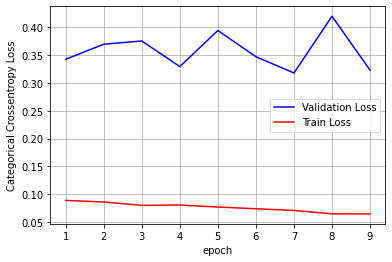

In [43]:
#Plotting the loss vs epoch plot
%matplotlib inline
fig,ax = plt.subplots(1,1)
ax.set_xlabel('epoch') ; ax.set_ylabel('Categorical Crossentropy Loss')

# list of epoch numbers
x = list(range(1,10))

vy = history_2.history['val_loss']
ty = history_2.history['loss']
plt_dynamic(x, vy, ty, ax)

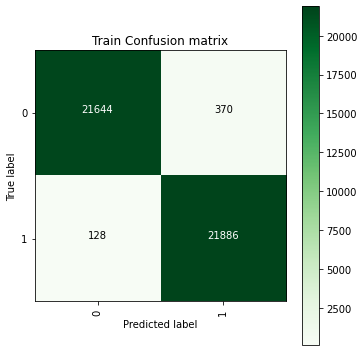

In [46]:
#Plotting Train Confusion Matrix
predictions = model.predict(X_train_cnn)
y_train_pred = (predictions > 0.5)

train_matrix = metrics.confusion_matrix(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(train_matrix, classes=[0,1], title='Train Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [47]:
#Computing Precision and Recall for Train dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)

print("Train Precision Score for Class 0 :",precision)
print("Train Recall Score for Class 0 :",recall)

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)

print("\nTrain Precision Score for Class 1 :",precision)
print("Train Recall Score for Class 1 :",recall)

Train Precision Score for Class 0 : 0.9941208892155061
Train Recall Score for Class 0 : 0.9831925138548196

Train Precision Score for Class 1 : 0.9833752695902228
Train Recall Score for Class 1 : 0.9941855183065322


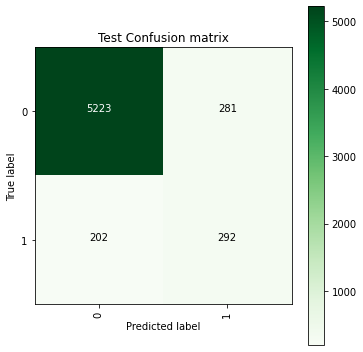

In [48]:
#Plotting Test Confusion Matrix
predictions = model.predict(X_test_cnn)
y_test_pred = (predictions > 0.5)

test_matrix = metrics.confusion_matrix(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(test_matrix, classes=[0,1], title='Test Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [49]:
#Computing Precision and Recall for Test dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)

print("Test Precision Score for Class 0 :",precision)
print("Test Recall Score for Class 0 :",recall)

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)

print("\nTest Precision Score for Class 1 :",precision)
print("Test Recall Score for Class 1 :",recall)

Test Precision Score for Class 0 : 0.9627649769585254
Test Recall Score for Class 0 : 0.9489462209302325

Test Precision Score for Class 1 : 0.5095986038394416
Test Recall Score for Class 1 : 0.5910931174089069


## LSTM

In [0]:
#Initializing few model parameters
batch_size = 128
num_classes = 2
epochs = 200

In [0]:
#Reshaping the data to make it compatible with LSTM Model
X_train_lstm = X_train.reshape(X_train.shape[0], 180, 1)
X_test_lstm = X_test.reshape(X_test.shape[0], 180, 1)
input_shape = (180,1)

In [0]:
#Building LSTM Model
from keras.layers import LSTM

model = Sequential()

#1st layer
model.add(LSTM(100, input_shape=input_shape, return_sequences=True))
model.add(MaxPooling1D(pool_size=(2)))

#2nd layer
model.add(LSTM(100, return_sequences=True))

#3rd layer
model.add(LSTM(100, return_sequences=True))

#4th layer
model.add(LSTM(100, return_sequences=True))
model.add(MaxPooling1D(pool_size=(2)))
model.add(Dropout(0.3))

#5th layer
model.add(LSTM(100, return_sequences=True))

#6th layer
model.add(LSTM(100, return_sequences=True))

#7th layer
model.add(LSTM(100, return_sequences=True))

#Fully connected 1st layer
model.add(Flatten()) 
model.add(Dense(500, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

#Fully connected final layer
model.add(Dense(num_classes, activation='softmax'))

#Compiling the model
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [0]:
#Defining Model Checkpointing and Early Stopping
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint3 = ModelCheckpoint("model_3.h5",
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only = True,
                             verbose=1)
earlystop3 = EarlyStopping(monitor = 'val_accuracy', 
                            mode="max",
                            min_delta = 0, 
                            patience = 5,
                            verbose = 1)

callbacks_3 = [checkpoint3,earlystop3]

In [65]:
#Training the model and evaluating the model accuracy
history_3 = model.fit(X_train_lstm, Y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          callbacks=callbacks_3,
          validation_data=(X_test_lstm, Y_test))
score = model.evaluate(X_test_lstm, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 44028 samples, validate on 5998 samples
Epoch 1/200
44028/44028 [==============================] - 496s 11ms/step - loss: 0.3711 - accuracy: 0.8419 - val_loss: 0.6102 - val_accuracy: 0.6871

Epoch 00001: val_accuracy improved from -inf to 0.68706, saving model to model_3.h5
Epoch 2/200
44028/44028 [==============================] - 495s 11ms/step - loss: 0.2791 - accuracy: 0.8871 - val_loss: 0.2763 - val_accuracy: 0.8941

Epoch 00002: val_accuracy improved from 0.68706 to 0.89413, saving model to model_3.h5
Epoch 3/200
44028/44028 [==============================] - 501s 11ms/step - loss: 0.2436 - accuracy: 0.9030 - val_loss: 0.4582 - val_accuracy: 0.9261

Epoch 00003: val_accuracy improved from 0.89413 to 0.92614, saving model to model_3.h5
Epoch 4/200
44028/44028 [==============================] - 497s 11ms/step - loss: 0.2202 - accuracy: 0.9126 - val_loss: 0.2442 - val_accuracy: 0.9098

Epoch 00004: val_accuracy did not improve from 0.92614
Epoch 5/200
44028/44028 [=========

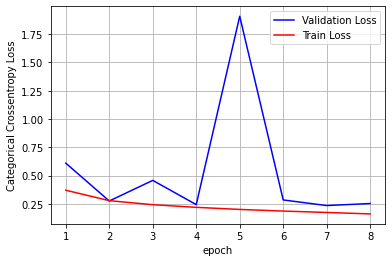

In [67]:
#Plotting the loss vs epoch plot
%matplotlib inline
fig,ax = plt.subplots(1,1)
ax.set_xlabel('epoch') ; ax.set_ylabel('Categorical Crossentropy Loss')

# list of epoch numbers
x = list(range(1,9))

vy = history_3.history['val_loss']
ty = history_3.history['loss']
plt_dynamic(x, vy, ty, ax)

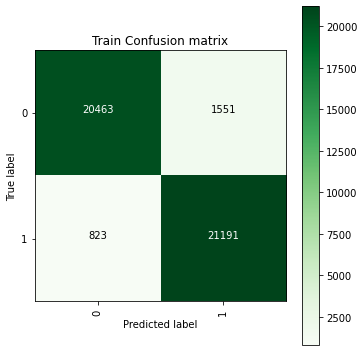

In [69]:
#Plotting Train Confusion Matrix
predictions = model.predict(X_train_lstm)
y_train_pred = (predictions > 0.5)

train_matrix = metrics.confusion_matrix(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(train_matrix, classes=[0,1], title='Train Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [70]:
#Computing Precision and Recall for Train dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)

print("Train Precision Score for Class 0 :",precision)
print("Train Recall Score for Class 0 :",recall)

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)

print("\nTrain Precision Score for Class 1 :",precision)
print("Train Recall Score for Class 1 :",recall)

Train Precision Score for Class 0 : 0.9613360894484638
Train Recall Score for Class 0 : 0.9295448351049332

Train Precision Score for Class 1 : 0.9318001934746284
Train Recall Score for Class 1 : 0.9626146997365312


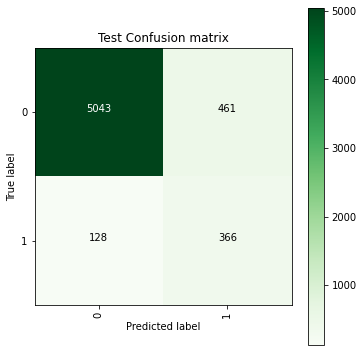

In [71]:
#Plotting Test Confusion Matrix
predictions = model.predict(X_test_lstm)
y_test_pred = (predictions > 0.5)

test_matrix = metrics.confusion_matrix(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(test_matrix, classes=[0,1], title='Test Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [72]:
#Computing Precision and Recall for Test dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)

print("Test Precision Score for Class 0 :",precision)
print("Test Recall Score for Class 0 :",recall)

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)

print("\nTest Precision Score for Class 1 :",precision)
print("Test Recall Score for Class 1 :",recall)

Test Precision Score for Class 0 : 0.975246567395088
Test Recall Score for Class 0 : 0.9162427325581395

Test Precision Score for Class 1 : 0.44256348246674726
Test Recall Score for Class 1 : 0.7408906882591093


## CNN-LSTM Model

In [0]:
#Initializing few model parameters
batch_size = 128
num_classes = 2
epochs = 200

In [0]:
#Reshaping the data to make it compatible with CNN-LSTM Model
X_train_cnn_lstm = X_train.reshape(X_train.shape[0], 180, 1)
X_test_cnn_lstm = X_test.reshape(X_test.shape[0], 180, 1)
input_shape = (180,1)

In [0]:
#Building CNN-LSTM Model
from keras.layers import LSTM

model = Sequential()

#1st layer
model.add(Conv1D(64, kernel_size=(5), padding='same', activation='relu', strides=(2), input_shape=input_shape))
model.add(MaxPooling1D(pool_size=(2)))

#2nd layer
model.add(Conv1D(64, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#3rd layer
model.add(Conv1D(96, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#4th layer
model.add(Conv1D(96, kernel_size=(5), padding='same', strides=(2), activation='relu'))

#5th layer
model.add(LSTM(100, return_sequences=True))
model.add(MaxPooling1D(pool_size=(2)))
model.add(Dropout(0.3))

#6th layer
model.add(LSTM(100, return_sequences=True))

#7th layer
model.add(LSTM(100, return_sequences=True))

#8th layer
model.add(LSTM(100, return_sequences=True))

#Fully connected 1st layer
model.add(Flatten()) 
model.add(Dense(500, activation='relu'))
model.add(Dropout(0.3))

#Fully connected final layer
model.add(Dense(num_classes, activation='softmax'))

model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer='adam',
              metrics=['accuracy'])

In [0]:
#Defining Model Checkpointing and Early Stopping
from keras.callbacks import ModelCheckpoint, EarlyStopping

checkpoint4 = ModelCheckpoint("model_4.h5",
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only = True,
                             verbose=1)
earlystop4 = EarlyStopping(monitor = 'val_accuracy', 
                            mode="max",
                            min_delta = 0, 
                            patience = 5,
                            verbose = 1)

callbacks_4 = [checkpoint4,earlystop4]

In [54]:
#Training the model and evaluating the model accuracy
history_4 = model.fit(X_train_cnn_lstm, Y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          callbacks=callbacks_4,
          validation_data=(X_test_cnn_lstm, Y_test))
score = model.evaluate(X_test_cnn_lstm, Y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Train on 44028 samples, validate on 5998 samples
Epoch 1/200
44028/44028 [==============================] - 21s 473us/step - loss: 0.3857 - accuracy: 0.8428 - val_loss: 0.3407 - val_accuracy: 0.8706

Epoch 00001: val_accuracy improved from -inf to 0.87062, saving model to model_4.h5
Epoch 2/200
44028/44028 [==============================] - 19s 429us/step - loss: 0.3314 - accuracy: 0.8668 - val_loss: 0.4205 - val_accuracy: 0.8321

Epoch 00002: val_accuracy did not improve from 0.87062
Epoch 3/200
44028/44028 [==============================] - 20s 447us/step - loss: 0.2996 - accuracy: 0.8800 - val_loss: 0.3277 - val_accuracy: 0.8688

Epoch 00003: val_accuracy did not improve from 0.87062
Epoch 4/200
44028/44028 [==============================] - 20s 450us/step - loss: 0.2647 - accuracy: 0.8949 - val_loss: 0.2843 - val_accuracy: 0.8846

Epoch 00004: val_accuracy improved from 0.87062 to 0.88463, saving model to model_4.h5
Epoch 5/200
44028/44028 [==============================] - 19s 434

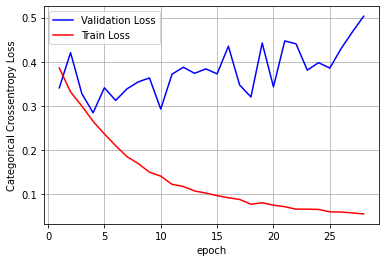

In [56]:
#Plotting the loss vs epoch plot
%matplotlib inline
fig,ax = plt.subplots(1,1)
ax.set_xlabel('epoch') ; ax.set_ylabel('Categorical Crossentropy Loss')

# list of epoch numbers
x = list(range(1,29))

vy = history_4.history['val_loss']
ty = history_4.history['loss']
plt_dynamic(x, vy, ty, ax)

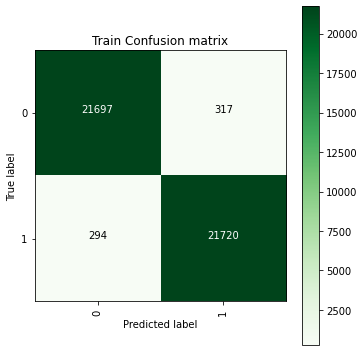

In [57]:
#Plotting Train Confusion Matrix
predictions = model.predict(X_train_cnn_lstm)
y_train_pred = (predictions > 0.5)

train_matrix = metrics.confusion_matrix(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(train_matrix, classes=[0,1], title='Train Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [58]:
#Computing Precision and Recall for Train dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=0)

print("Train Precision Score for Class 0 :",precision)
print("Train Recall Score for Class 0 :",recall)

precision = precision_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_train.argmax(axis=1), y_train_pred.argmax(axis=1),pos_label=1)

print("\nTrain Precision Score for Class 1 :",precision)
print("Train Recall Score for Class 1 :",recall)

Train Precision Score for Class 0 : 0.9866308944568233
Train Recall Score for Class 0 : 0.9856000726810211

Train Precision Score for Class 1 : 0.9856151018741208
Train Recall Score for Class 1 : 0.9866448623603161


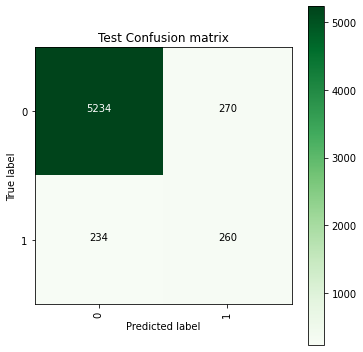

In [59]:
#Plotting Test Confusion Matrix
predictions = model.predict(X_test_cnn_lstm)
y_test_pred = (predictions > 0.5)

test_matrix = metrics.confusion_matrix(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1))

plt.figure(figsize=(5,5))
plt.grid(b=False)
plot_confusion_matrix(test_matrix, classes=[0,1], title='Test Confusion matrix', cmap = plt.cm.Greens)
plt.show()

In [60]:
#Computing Precision and Recall for Test dataset
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=0)

print("Test Precision Score for Class 0 :",precision)
print("Test Recall Score for Class 0 :",recall)

precision = precision_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)
recall = recall_score(Y_test.argmax(axis=1), y_test_pred.argmax(axis=1),pos_label=1)

print("\nTest Precision Score for Class 1 :",precision)
print("Test Recall Score for Class 1 :",recall)

Test Precision Score for Class 0 : 0.957205559619605
Test Recall Score for Class 0 : 0.9509447674418605

Test Precision Score for Class 1 : 0.49056603773584906
Test Recall Score for Class 1 : 0.5263157894736842


Out of the 4 models, CNN model performed best with an accuracy score of **91.95%**

## Summary

### Summary of all Models 

In [73]:
#Printing summary using prettytable
from prettytable import PrettyTable
    
x = PrettyTable()

x.field_names = ["Model", "Recursive Feature Elimination", "Model Based Imputation","Test Accuracy", "Test AUC"]

x.add_row(["K Nearest Neighbours", "No", "No", 0.8924, 0.8537])
x.add_row(["Logistic Regression", "No", "No", 0.8275, 0.8543])
x.add_row(["Linear SVM", "No", "No", 0.8685, 0.8855])
x.add_row(["Decision Trees", "No", "No", 0.8912, 0.8294])
x.add_row(["Random Forest", "No", "No", 0.922, 0.9308])
x.add_row(["XGBoost", "No", "No", 0.9437, 0.9509])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["Logistic Regression", "Yes", "No", 0.8404, 0.8223])
x.add_row(["Linear SVM", "Yes", "No", 0.8499, 0.8565])
x.add_row(["Decision Trees", "Yes", "No", 0.8914, 0.8358])
x.add_row(["Random Forest", "Yes", "No", 0.8355, 0.5236])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["Stacking Model", "No", "No", 0.9467, 0.7986])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["Logistic Regression", "No", "Yes", 0.8184, 0.8180])
x.add_row(["Random Forest", "No", "Yes", 0.9268, 0.9451])
x.add_row(["XGBoost", "No", "Yes", 0.9571, 0.9731])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["Decision Trees", "Yes", "Yes", 0.9085, 0.8346])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["Stacking Model", "No", "Yes", 0.9506, 0.8775])
x.add_row(["\n", "\n", "\n", "\n", "\n"])
x.add_row(["MLP Model", "No", "Yes", 0.9188, "-"])
x.add_row(["CNN Model", "No", "Yes", 0.9195, "-"])
x.add_row(["LSTM Model", "No", "Yes", 0.9018, "-"])
x.add_row(["CNN-LSTM Model", "No", "Yes", 0.9160, "-"])

print(x)

+----------------------+-------------------------------+------------------------+---------------+----------+
|        Model         | Recursive Feature Elimination | Model Based Imputation | Test Accuracy | Test AUC |
+----------------------+-------------------------------+------------------------+---------------+----------+
| K Nearest Neighbours |               No              |           No           |     0.8924    |  0.8537  |
| Logistic Regression  |               No              |           No           |     0.8275    |  0.8543  |
|      Linear SVM      |               No              |           No           |     0.8685    |  0.8855  |
|    Decision Trees    |               No              |           No           |     0.8912    |  0.8294  |
|    Random Forest     |               No              |           No           |     0.922     |  0.9308  |
|       XGBoost        |               No              |           No           |     0.9437    |  0.9509  |
|                  

### Comparison of Models with and without Model based Imputation

In [0]:
#Comparing using prettytable
from prettytable import PrettyTable
    
x = PrettyTable()

#Here we refer Model Based Imputation as MBI
x.field_names = ["Model", "Test Accuracy without MBI", "Test AUC without MBI","Test Accuracy with MBI", "Test AUC with MBI"]


x.add_row(["Logistic Regression", 0.8275, 0.8543, 0.8184, 0.8180])
x.add_row(["Random Forest", 0.922, 0.9308, 0.9268, 0.9451])
x.add_row(["XGBoost", 0.9437, 0.9509, 0.9571, 0.9731])
x.add_row(["Decision Trees with RFE", 0.8914, 0.8358, 0.9085, 0.8346])
x.add_row(["Stacking Model", 0.9467, 0.7986, 0.9506, 0.8775])

print(x)

+-------------------------+---------------------------+----------------------+------------------------+-------------------+
|          Model          | Test Accuracy without MBI | Test AUC without MBI | Test Accuracy with MBI | Test AUC with MBI |
+-------------------------+---------------------------+----------------------+------------------------+-------------------+
|   Logistic Regression   |           0.8275          |        0.8543        |         0.8184         |       0.818       |
|      Random Forest      |           0.922           |        0.9308        |         0.9268         |       0.9451      |
|         XGBoost         |           0.9437          |        0.9509        |         0.9571         |       0.9731      |
| Decision Trees with RFE |           0.8914          |        0.8358        |         0.9085         |       0.8346      |
|      Stacking Model     |           0.9467          |        0.7986        |         0.9506         |       0.8775      |
+-------

   The dataset of the initial models we built are zero imputed in place of NAN/Null values whereas the models built later followed 'Model Based Imputation'. If we compare the models with and without 'Model based Imputation', it is clearly visible that the models with 'Model Based Imputation' have a upper hand over the ones without 'Model Based Imputation'. We can infer the same from the above table.
   
   The best performing models like XGBoost and Stacking model have an accuracy of 95.71% and 95.06% respectively with 'model based Imputation' compared to their counterparts without 'Model Based Imputation' whose scores are 94.37% and 94.67%. Other models also performed better with 'Model Based Imputation'. So the clear winner is Models with 'Model Based Imputation'.

In a nutshell, though all the models performed fairly better, **XGBoost with Model Based Imputation** is the best model with Accuracy of **95.71%** and AUC score of **97.31%** followed by **Stacking Model with Model Based Imputation** with 95.13% accuracy.

## Feature Importance

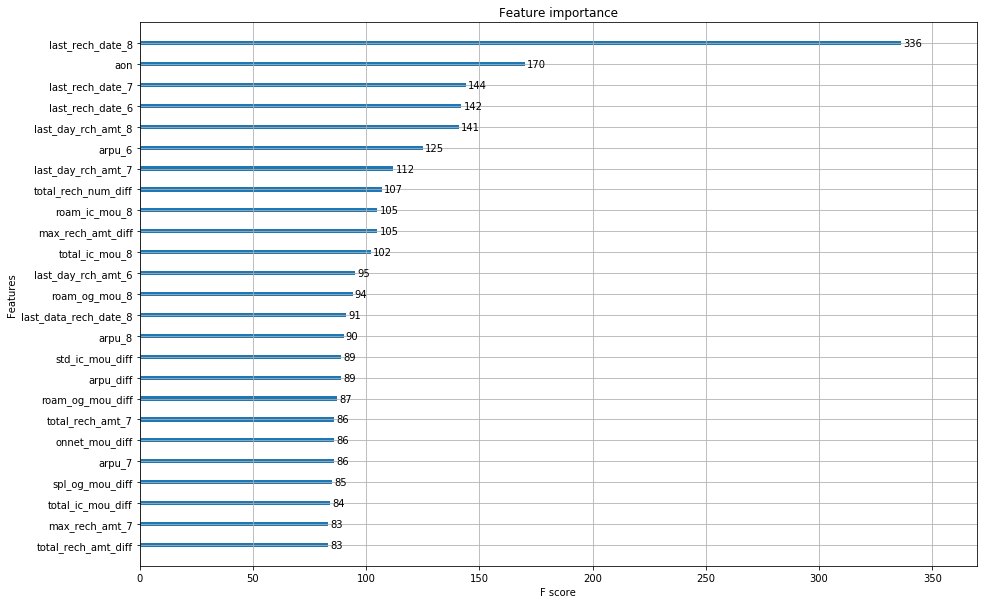

In [0]:
#calculating and plotting feature importance using XGBoost Model which is the best model
from xgboost import plot_importance
from matplotlib import pyplot

fig, ax = plt.subplots(figsize=(15, 10))
xgb.plot_importance(XGB,max_num_features=25, ax=ax)

## Business Insights 

1) Of the top 4 features, 3 features are related to 'Last recharge date'. This clearly shows last recharge date is a key thing to determine the churn.

2) In particular, the 'Last recharge date' of 8th month has a score of almost twice as that of AON(second most important feature) which makes it primarily important. So the company should focus on the customers who haven't recharged their number for long time and should give offers and discounts to them to retain them.

3) AON (Age on Network) plays a major role in identifying the customers who are highly likely to churn. Short term customers with reduced usage should be taken care of.

4) Recharge amount for 7th and 8th months also top the list. So Recharge amount is another factor to identify churn. Customers who are unhappy with the services may acquire a new sim of competitor for primary use and have this one as a secondary sim as most of the mobiles nowadays support dual sim. So company should look into customers whose recharge value decreases all of a sudden.

5) ARPU (Average Revenue Per user) also helps in analyzing churn. ARPU for all the 3 months are in the top 25 features which makes it one of the important features. ARPU gives a clear indication to the company that customer is about to churn. So company should check with those customers on their satisfactory level and retain them by giving good customer experience.

6) The number of times a customer recharges his number is important as well. So the company should consider the same.

7) MOU (Minutes of usage) for 8th month has drastically reduced for unhappy customers.

8) The company should look into the roaming and STD prices and try to reduce them in order to retain the customers.

9) The company should consider all the important features discussed above and should interact with the customers to get to know how well they are satisified with the company's service. They should improve on the areas where they are lagging and should give more offers, discounts and most importantly the best customer experience.